[NOTE] Azimuth angle can be determined from channel config.
[NOTE] Complex 1x mode


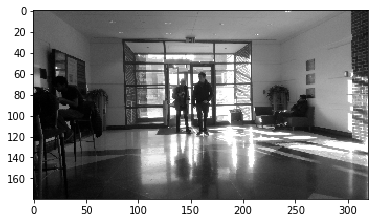


50 Radar Frames and 50 RGB Frames Loaded


In [1]:
import sys
sys.path.insert(1, '/home/spencer/research/OpenRadar')  # needed to import openradar not in folder
try: sys.path.remove('/opt/ros/kinetic/lib/python2.7/dist-packages')  # fixes issues with env variables
except: pass
import numpy as np
import mmwave as mm
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pickle
import os
import copy
from scipy.ndimage import gaussian_filter1d
from scipy import interpolate
from sklearn.preprocessing import minmax_scale
sys.path.insert(0,'..')
from ista import joint_sum_ista, joint_prod_ista, joint_mix_ista, ista


def rgb2gray(rgb):
    return np.dot(rgb[..., :3], [0.2989, 0.5870, 0.1140])

radar_frames_path = '../radar_frames_csl_lobby_700.txt'
cfg_path = '/home/spencer/research/ti-radar-hardware/mmWave/scripts/configs/14xx/indoor_human_rcs.cfg'  # radar config
rgb_dir_path = '/home/spencer/research/radar-rgb-bfs/RGB_images'
camera_matrix_path = '../camera_mat.npy'

radar_frames = pickle.load(open(radar_frames_path, 'rb'))
iwr_cfg_cmd = mm.dataloader.cfg_list_from_cfg(cfg_path)  # this is the config sent to the radar
iwr_cfg_dict = mm.dataloader.cfg_list_to_dict(iwr_cfg_cmd)  # this is the dictionary of config

images = np.array([plt.imread(os.path.join(rgb_dir_path, 'rgb_{}.png'.format(i))) for i in range(len(radar_frames))])
images = rgb2gray(images)
images = images[:,::4,::4] ########################################
plt.imshow(images[0],cmap='gray')
plt.show()
D = images.reshape(images.shape[0], -1).T

camera_mat = np.load(camera_matrix_path)
fx = camera_mat[0, 0]
x_c = camera_mat[0, 2]

print('\n%d Radar Frames and %d RGB Frames Loaded' % (len(radar_frames), len(images)))

In [2]:
BINS_PROCESSED = 304  # If you want to zoom in plot, make this 120
VIRT_ANT = 8  # virtual antennas because we use time division multiple access to simulate a larger antenna array
DOPPLER_BINS = 32
ANGLE_RES = 1  # 1 degree resolution
ANGLE_RANGE = 90  # so we get 181 angle bins [0,180]
ANGLE_BINS = (ANGLE_RANGE * 2) // ANGLE_RES + 1
range_azimuth = np.zeros((ANGLE_BINS, BINS_PROCESSED), dtype=np.complex_)
num_vec, steering_vec = mm.dsp.gen_steering_vec(ANGLE_RANGE, ANGLE_RES, VIRT_ANT)  # steering vector is a(theta) in most literature

radar_range_azs = []
for ii in range(len(radar_frames)):
    test_radar_frame = radar_frames[ii]
    test_radar_cube = mm.dsp.range_processing(test_radar_frame)
    # mean = test_radar_cube.mean(0)
    # test_radar_cube = test_radar_cube - mean

    (test_log_doppler_cube, test_doppler_cube) = mm.dsp.doppler_processing(test_radar_cube,
                                                 num_tx_antennas=iwr_cfg_dict['numTx'], clutter_removal_enabled=False,
                                                 interleaved=False, window_type_2d=mm.dsp.utils.Window.HAMMING,
                                                 accumulate=False,phase_correction=True)

    test_doppler_cube = np.fft.fftshift(test_doppler_cube, axes=(2,))
    test_log_doppler_cube = np.fft.fftshift(test_log_doppler_cube, axes=(2,))

    beamforming_result = np.zeros([BINS_PROCESSED,ANGLE_BINS],dtype=np.complex_) # range bins x angle bins

    for jj in range(BINS_PROCESSED):
        beamforming_result[jj,:], _ = mm.dsp.aoa_capon(test_doppler_cube[jj], steering_vec)

    radar_range_azs.append(np.flip(beamforming_result,axis=1))
    # plt.figure(figsize=(15,10))
    # plt.tight_layout(True)
    # plt.subplot(111, projection='polar')
    # # # cartesian coordinates (looks like real life)
    # # beamforming_result = np.flip(beamforming_result,axis=1)  # dont know why we need this but we'll be using own polar transform in future
    # #
    # azimuths = np.radians(np.linspace(0, 180, 181))
    # zeniths = np.linspace(0, range_res*BINS_PROCESSED, BINS_PROCESSED)
    # r, theta = np.meshgrid(zeniths, azimuths)
    # values = beamforming_result.T
    # plt.pcolormesh(theta, r, np.log(np.abs(values)))
    # plt.grid()
    # plt.xlim([0,np.pi])
    # plt.show()

radar_az_amps = [np.sum(np.abs(r_a), axis=0) for r_a in radar_range_azs]
radar_az_log_amps = [np.log(a_a) for a_a in radar_az_amps]

# determine FOV in deg
right = images[0].shape[1]
left = 0

print('Left Min Angle', 180 / np.pi * np.arctan((left - x_c) / fx))
print('Right Max Angle', 180 / np.pi * np.arctan((4*right - x_c) / fx)) ##################### 2

pixel_angles = 180 / np.pi * np.arctan((4*np.arange(right) - x_c) / fx) ##################### 2
front_angles = np.arange(-90, 91)

front_angles = np.arange(-90, 91)
pixel_amplitudes = []

for frame_idx in range(len(radar_az_amps)):
    radar_az_log_amp = radar_az_log_amps[frame_idx]

    f = interpolate.interp1d(front_angles, radar_az_log_amp)
    pixel_amps = f(pixel_angles) - np.min(radar_az_log_amps)
    pixel_amplitudes.append(pixel_amps)
    # plt.imshow(images[frame_idx], extent=[0, 1280, 0, 720])
    # plt.plot((pixel_amps) * 200, '--', c='lime', linewidth=4)
    # plt.show()

M_F = np.array(pixel_amplitudes)[:, :, np.newaxis] * np.ones((images.shape[0], images.shape[2], images.shape[1]))
M_F = np.swapaxes(M_F, 1, 2).reshape(images.shape[0], -1)
M_F = M_F.T
M_F /= np.max(M_F)


Left Min Angle -35.16107322153295
Right Max Angle 34.346996918680944


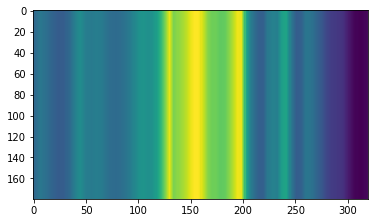

In [3]:
plt.imshow(M_F[:,10].reshape(720//4,-1))######
plt.show()

mu = 0.6306509783844475
Image L rank:  50
Radar L rank:  40
Time:  0.07801246643066406
Iteration:  0


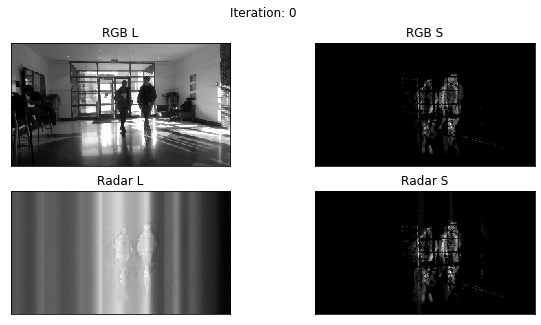

Image L rank:  35
Radar L rank:  31
Time:  0.12477326393127441
Iteration:  1
Image L rank:  30
Radar L rank:  28
Time:  0.1164865493774414
Iteration:  2
Image L rank:  28
Radar L rank:  28
Time:  0.11569356918334961
Iteration:  3
Image L rank:  27
Radar L rank:  27
Time:  0.11828279495239258
Iteration:  4
Image L rank:  26
Radar L rank:  26
Time:  0.10867857933044434
Iteration:  5
Image L rank:  24
Radar L rank:  24
Time:  0.1097869873046875
Iteration:  6
Image L rank:  23
Radar L rank:  22
Time:  0.09681963920593262
Iteration:  7
Image L rank:  21
Radar L rank:  21
Time:  0.09098625183105469
Iteration:  8
Image L rank:  20
Radar L rank:  20
Time:  0.08479094505310059
Iteration:  9
Image L rank:  19
Radar L rank:  19
Time:  0.1064915657043457
Iteration:  10


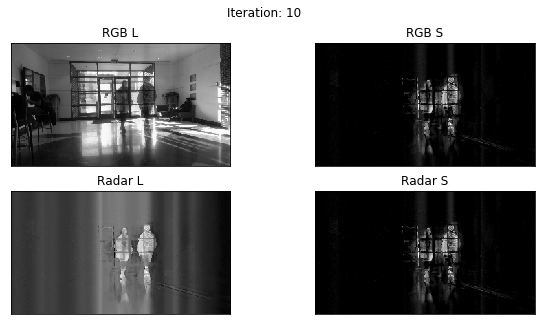

Image L rank:  19
Radar L rank:  18
Time:  0.09789824485778809
Iteration:  11
Image L rank:  18
Radar L rank:  18
Time:  0.07574343681335449
Iteration:  12
Image L rank:  18
Radar L rank:  17
Time:  0.09708356857299805
Iteration:  13
Image L rank:  17
Radar L rank:  17
Time:  0.07299256324768066
Iteration:  14
Image L rank:  17
Radar L rank:  16
Time:  0.07750344276428223
Iteration:  15
Image L rank:  16
Radar L rank:  16
Time:  0.07229995727539062
Iteration:  16
Image L rank:  16
Radar L rank:  16
Time:  0.07449007034301758
Iteration:  17
Image L rank:  15
Radar L rank:  15
Time:  0.07059741020202637
Iteration:  18
Image L rank:  15
Radar L rank:  15
Time:  0.06759428977966309
Iteration:  19
Image L rank:  15
Radar L rank:  15
Time:  0.06711840629577637
Iteration:  20


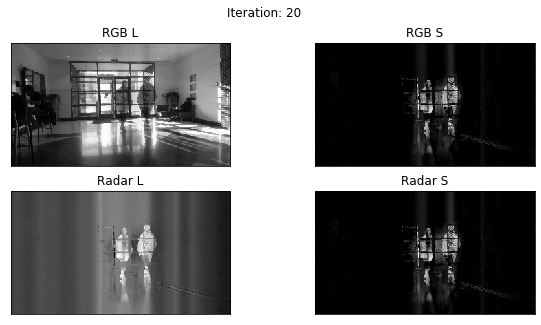

Image L rank:  15
Radar L rank:  15
Time:  0.06685948371887207
Iteration:  21
Image L rank:  15
Radar L rank:  15
Time:  0.06817817687988281
Iteration:  22
Image L rank:  15
Radar L rank:  14
Time:  0.06504607200622559
Iteration:  23
Image L rank:  15
Radar L rank:  14
Time:  0.06555652618408203
Iteration:  24
Image L rank:  15
Radar L rank:  14
Time:  0.06803345680236816
Iteration:  25
Image L rank:  15
Radar L rank:  15
Time:  0.0656881332397461
Iteration:  26
Image L rank:  14
Radar L rank:  14
Time:  0.06261134147644043
Iteration:  27
Image L rank:  14
Radar L rank:  15
Time:  0.06194901466369629
Iteration:  28
Image L rank:  15
Radar L rank:  14
Time:  0.06601691246032715
Iteration:  29
Image L rank:  14
Radar L rank:  14
Time:  0.07483553886413574
Iteration:  30


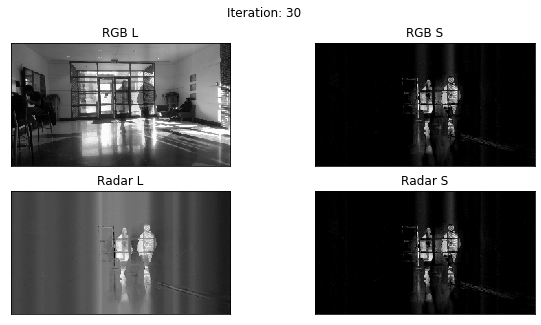

Image L rank:  14
Radar L rank:  14
Time:  0.059362173080444336
Iteration:  31
Image L rank:  14
Radar L rank:  14
Time:  0.0618746280670166
Iteration:  32
Image L rank:  14
Radar L rank:  14
Time:  0.0616765022277832
Iteration:  33
Image L rank:  14
Radar L rank:  13
Time:  0.06308937072753906
Iteration:  34
Image L rank:  14
Radar L rank:  14
Time:  0.06310272216796875
Iteration:  35
Image L rank:  13
Radar L rank:  14
Time:  0.05840873718261719
Iteration:  36
Image L rank:  14
Radar L rank:  13
Time:  0.06252360343933105
Iteration:  37
Image L rank:  13
Radar L rank:  13
Time:  0.05879044532775879
Iteration:  38
Image L rank:  14
Radar L rank:  14
Time:  0.06302094459533691
Iteration:  39
Image L rank:  13
Radar L rank:  13
Time:  0.05940508842468262
Iteration:  40


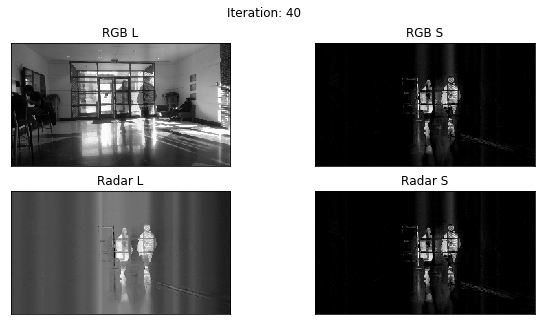

Image L rank:  13
Radar L rank:  14
Time:  0.056471824645996094
Iteration:  41
Image L rank:  14
Radar L rank:  13
Time:  0.06324052810668945
Iteration:  42
Image L rank:  13
Radar L rank:  13
Time:  0.05882549285888672
Iteration:  43
Image L rank:  13
Radar L rank:  13
Time:  0.058844566345214844
Iteration:  44
Image L rank:  14
Radar L rank:  14
Time:  0.06324100494384766
Iteration:  45
Image L rank:  14
Radar L rank:  13
Time:  0.06292390823364258
Iteration:  46
Image L rank:  13
Radar L rank:  13
Time:  0.06001853942871094
Iteration:  47
Image L rank:  13
Radar L rank:  12
Time:  0.05992531776428223
Iteration:  48
Image L rank:  13
Radar L rank:  13
Time:  0.05957746505737305
Iteration:  49
Image L rank:  13
Radar L rank:  13
Time:  0.059366703033447266
Iteration:  50


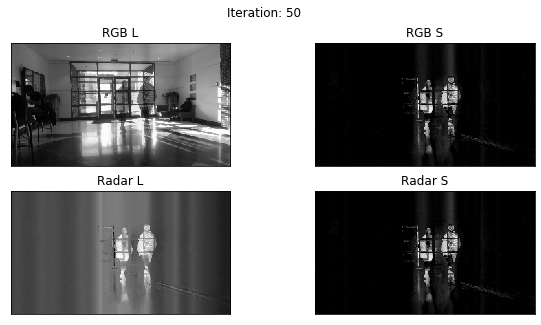

Image L rank:  13
Radar L rank:  13
Time:  0.057251691818237305
Iteration:  51
Image L rank:  12
Radar L rank:  13
Time:  0.05261874198913574
Iteration:  52
Image L rank:  13
Radar L rank:  13
Time:  0.05991673469543457
Iteration:  53
Image L rank:  13
Radar L rank:  13
Time:  0.05944085121154785
Iteration:  54
Image L rank:  13
Radar L rank:  13
Time:  0.05986475944519043
Iteration:  55
Image L rank:  13
Radar L rank:  12
Time:  0.0589289665222168
Iteration:  56
Image L rank:  12
Radar L rank:  12
Time:  0.05282998085021973
Iteration:  57
Image L rank:  13
Radar L rank:  12
Time:  0.05951261520385742
Iteration:  58
Image L rank:  12
Radar L rank:  13
Time:  0.05278277397155762
Iteration:  59
Image L rank:  13
Radar L rank:  12
Time:  0.059085845947265625
Iteration:  60


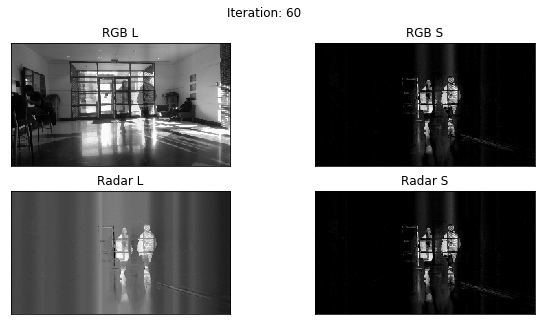

Image L rank:  12
Radar L rank:  12
Time:  0.050728797912597656
Iteration:  61
Image L rank:  13
Radar L rank:  13
Time:  0.06031656265258789
Iteration:  62
Image L rank:  13
Radar L rank:  12
Time:  0.06557655334472656
Iteration:  63
Image L rank:  13
Radar L rank:  13
Time:  0.06590700149536133
Iteration:  64
Image L rank:  13
Radar L rank:  12
Time:  0.06168985366821289
Iteration:  65
Image L rank:  13
Radar L rank:  13
Time:  0.06121420860290527
Iteration:  66
Image L rank:  13
Radar L rank:  12
Time:  0.06090736389160156
Iteration:  67
Image L rank:  12
Radar L rank:  13
Time:  0.05543780326843262
Iteration:  68
Image L rank:  13
Radar L rank:  12
Time:  0.0603792667388916
Iteration:  69
Image L rank:  12
Radar L rank:  12
Time:  0.05308723449707031
Iteration:  70


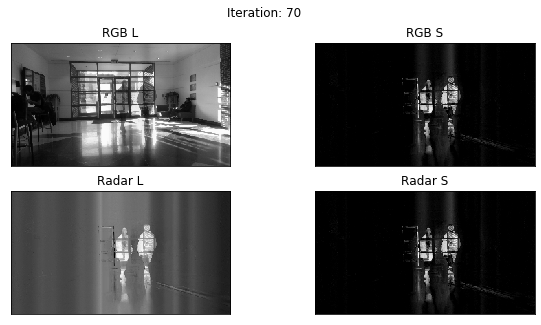

Image L rank:  12
Radar L rank:  12
Time:  0.05448412895202637
Iteration:  71
Image L rank:  12
Radar L rank:  13
Time:  0.061432838439941406
Iteration:  72
Image L rank:  12
Radar L rank:  12
Time:  0.05416727066040039
Iteration:  73
Image L rank:  12
Radar L rank:  13
Time:  0.05455803871154785
Iteration:  74
Image L rank:  12
Radar L rank:  12
Time:  0.05611300468444824
Iteration:  75
Image L rank:  12
Radar L rank:  12
Time:  0.05612492561340332
Iteration:  76
Image L rank:  12
Radar L rank:  13
Time:  0.06108450889587402
Iteration:  77
Image L rank:  12
Radar L rank:  12
Time:  0.05700063705444336
Iteration:  78
Image L rank:  12
Radar L rank:  12
Time:  0.058290958404541016
Iteration:  79
Image L rank:  12
Radar L rank:  12
Time:  0.057875871658325195
Iteration:  80


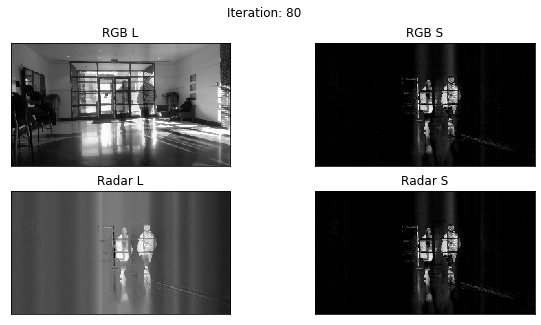

Image L rank:  12
Radar L rank:  12
Time:  0.05934333801269531
Iteration:  81
Image L rank:  12
Radar L rank:  12
Time:  0.05860590934753418
Iteration:  82
Image L rank:  12
Radar L rank:  12
Time:  0.0696420669555664
Iteration:  83
Image L rank:  12
Radar L rank:  12
Time:  0.057959794998168945
Iteration:  84
Image L rank:  12
Radar L rank:  12
Time:  0.060903072357177734
Iteration:  85
Image L rank:  12
Radar L rank:  12
Time:  0.06067347526550293
Iteration:  86
Image L rank:  12
Radar L rank:  12
Time:  0.0683891773223877
Iteration:  87
Image L rank:  12
Radar L rank:  12
Time:  0.06857848167419434
Iteration:  88
Image L rank:  13
Radar L rank:  12
Time:  0.08471941947937012
Iteration:  89
Image L rank:  12
Radar L rank:  12
Time:  0.05897641181945801
Iteration:  90


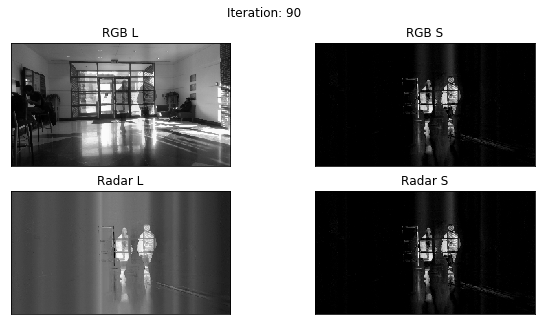

Image L rank:  12
Radar L rank:  12
Time:  0.07156848907470703
Iteration:  91
Image L rank:  12
Radar L rank:  12
Time:  0.061033010482788086
Iteration:  92
Image L rank:  12
Radar L rank:  12
Time:  0.05995535850524902
Iteration:  93
Image L rank:  12
Radar L rank:  12
Time:  0.0583958625793457
Iteration:  94
Image L rank:  13
Radar L rank:  12
Time:  0.10161256790161133
Iteration:  95
Image L rank:  12
Radar L rank:  12
Time:  0.09256315231323242
Iteration:  96
Image L rank:  12
Radar L rank:  12
Time:  0.0783383846282959
Iteration:  97
Image L rank:  13
Radar L rank:  12
Time:  0.08803749084472656
Iteration:  98
Image L rank:  12
Radar L rank:  12
Time:  0.1029362678527832
Iteration:  99
Image L rank:  12
Radar L rank:  13
Time:  0.0798335075378418
Iteration:  100


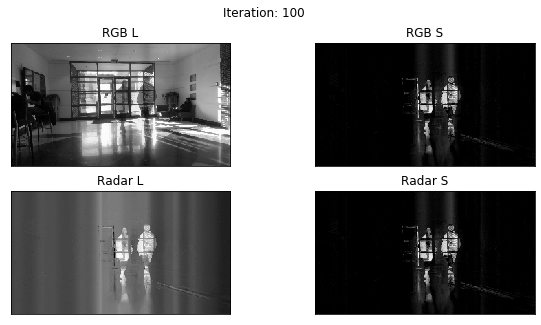

Image L rank:  13
Radar L rank:  13
Time:  0.08381366729736328
Iteration:  101
Image L rank:  12
Radar L rank:  12
Time:  0.0899498462677002
Iteration:  102
Image L rank:  12
Radar L rank:  11
Time:  0.11914849281311035
Iteration:  103
Image L rank:  12
Radar L rank:  13
Time:  0.08342790603637695
Iteration:  104
Image L rank:  13
Radar L rank:  12
Time:  0.14139223098754883
Iteration:  105
Image L rank:  12
Radar L rank:  12
Time:  0.08311057090759277
Iteration:  106
Image L rank:  11
Radar L rank:  12
Time:  0.07840538024902344
Iteration:  107
Image L rank:  12
Radar L rank:  12
Time:  0.08202290534973145
Iteration:  108
Image L rank:  12
Radar L rank:  12
Time:  0.0846865177154541
Iteration:  109
Image L rank:  12
Radar L rank:  12
Time:  0.08156633377075195
Iteration:  110


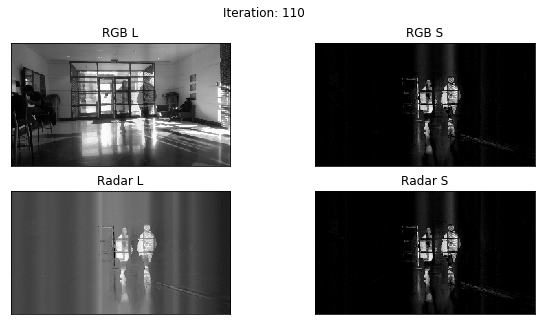

Image L rank:  12
Radar L rank:  13
Time:  0.0876612663269043
Iteration:  111
Image L rank:  12
Radar L rank:  12
Time:  0.08833098411560059
Iteration:  112
Image L rank:  12
Radar L rank:  12
Time:  0.08160781860351562
Iteration:  113
Image L rank:  12
Radar L rank:  12
Time:  0.09250783920288086
Iteration:  114
Image L rank:  12
Radar L rank:  13
Time:  0.08718061447143555
Iteration:  115
Image L rank:  12
Radar L rank:  12
Time:  0.07412123680114746
Iteration:  116
Image L rank:  12
Radar L rank:  12
Time:  0.11807060241699219
Iteration:  117
Image L rank:  12
Radar L rank:  12
Time:  0.07423949241638184
Iteration:  118
Image L rank:  12
Radar L rank:  12
Time:  0.08090329170227051
Iteration:  119
Image L rank:  12
Radar L rank:  12
Time:  0.07285904884338379
Iteration:  120


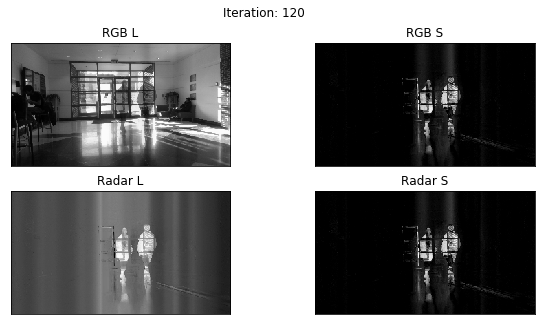

Image L rank:  12
Radar L rank:  12
Time:  0.0755615234375
Iteration:  121
Image L rank:  12
Radar L rank:  13
Time:  0.08147478103637695
Iteration:  122
Image L rank:  12
Radar L rank:  12
Time:  0.07285094261169434
Iteration:  123
Image L rank:  12
Radar L rank:  12
Time:  0.07343649864196777
Iteration:  124
Image L rank:  11
Radar L rank:  12
Time:  0.09234738349914551
Iteration:  125
Image L rank:  12
Radar L rank:  11
Time:  0.1137077808380127
Iteration:  126
Image L rank:  12
Radar L rank:  12
Time:  0.10630035400390625
Iteration:  127
Image L rank:  12
Radar L rank:  12
Time:  0.08028411865234375
Iteration:  128
Image L rank:  13
Radar L rank:  12
Time:  0.0979464054107666
Iteration:  129
Image L rank:  12
Radar L rank:  12
Time:  0.1266343593597412
Iteration:  130


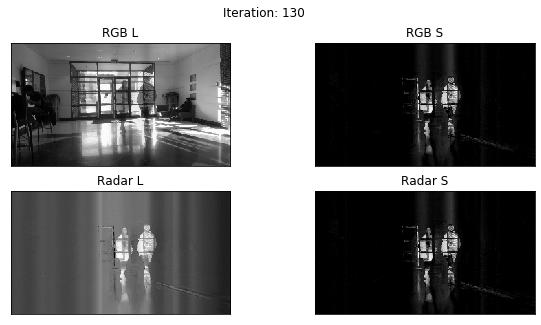

Image L rank:  11
Radar L rank:  12
Time:  0.07990860939025879
Iteration:  131
Image L rank:  13
Radar L rank:  13
Time:  0.141465425491333
Iteration:  132
Image L rank:  13
Radar L rank:  13
Time:  0.0824575424194336
Iteration:  133
Image L rank:  12
Radar L rank:  12
Time:  0.07725834846496582
Iteration:  134
Image L rank:  12
Radar L rank:  12
Time:  0.08460140228271484
Iteration:  135
Image L rank:  12
Radar L rank:  12
Time:  0.07833504676818848
Iteration:  136
Image L rank:  12
Radar L rank:  13
Time:  0.07320880889892578
Iteration:  137
Image L rank:  12
Radar L rank:  12
Time:  0.08435869216918945
Iteration:  138
Image L rank:  12
Radar L rank:  12
Time:  0.2664065361022949
Iteration:  139
Image L rank:  12
Radar L rank:  13
Time:  0.5017170906066895
Iteration:  140


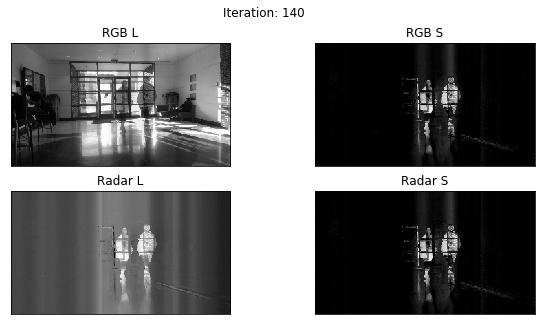

Image L rank:  13
Radar L rank:  12
Time:  0.44402170181274414
Iteration:  141
Image L rank:  12
Radar L rank:  13
Time:  0.45302391052246094
Iteration:  142
Image L rank:  12
Radar L rank:  12
Time:  0.3206484317779541
Iteration:  143
Image L rank:  12
Radar L rank:  13
Time:  0.21026110649108887
Iteration:  144
Image L rank:  13
Radar L rank:  12
Time:  0.22272491455078125
Iteration:  145
Image L rank:  12
Radar L rank:  12
Time:  0.27678489685058594
Iteration:  146
Image L rank:  12
Radar L rank:  12
Time:  0.15592384338378906
Iteration:  147
Image L rank:  12
Radar L rank:  12
Time:  0.23108887672424316
Iteration:  148
Image L rank:  12
Radar L rank:  12
Time:  0.27602219581604004
Iteration:  149
Image L rank:  12
Radar L rank:  12
Time:  0.20562458038330078
Iteration:  150


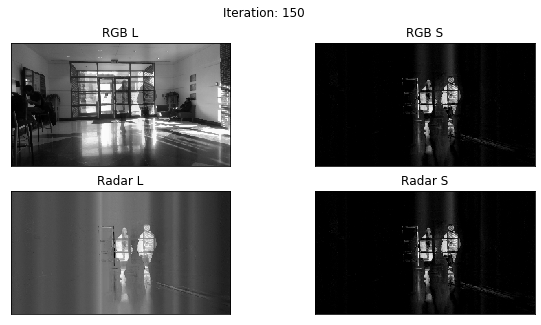

Image L rank:  12
Radar L rank:  12
Time:  0.12763619422912598
Iteration:  151
Image L rank:  11
Radar L rank:  12
Time:  0.1400623321533203
Iteration:  152
Image L rank:  12
Radar L rank:  13
Time:  0.20679712295532227
Iteration:  153
Image L rank:  12
Radar L rank:  12
Time:  0.4306042194366455
Iteration:  154
Image L rank:  12
Radar L rank:  12
Time:  0.2924206256866455
Iteration:  155
Image L rank:  12
Radar L rank:  12
Time:  0.1406407356262207
Iteration:  156
Image L rank:  12
Radar L rank:  12
Time:  0.1952812671661377
Iteration:  157
Image L rank:  12
Radar L rank:  12
Time:  0.1352081298828125
Iteration:  158
Image L rank:  12
Radar L rank:  12
Time:  0.15981149673461914
Iteration:  159
Image L rank:  13
Radar L rank:  12
Time:  0.1531212329864502
Iteration:  160


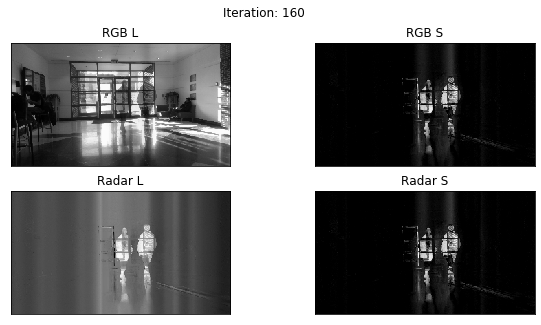

Image L rank:  12
Radar L rank:  12
Time:  0.11532163619995117
Iteration:  161
Image L rank:  12
Radar L rank:  12
Time:  0.1492292881011963
Iteration:  162
Image L rank:  12
Radar L rank:  12
Time:  0.14459729194641113
Iteration:  163
Image L rank:  13
Radar L rank:  12
Time:  0.28150129318237305
Iteration:  164
Image L rank:  12
Radar L rank:  12
Time:  0.18326306343078613
Iteration:  165
Image L rank:  12
Radar L rank:  13
Time:  0.33996033668518066
Iteration:  166
Image L rank:  12
Radar L rank:  12
Time:  0.18381190299987793
Iteration:  167
Image L rank:  12
Radar L rank:  12
Time:  0.1408681869506836
Iteration:  168
Image L rank:  12
Radar L rank:  12
Time:  0.5559465885162354
Iteration:  169
Image L rank:  12
Radar L rank:  12
Time:  0.0548095703125
Iteration:  170


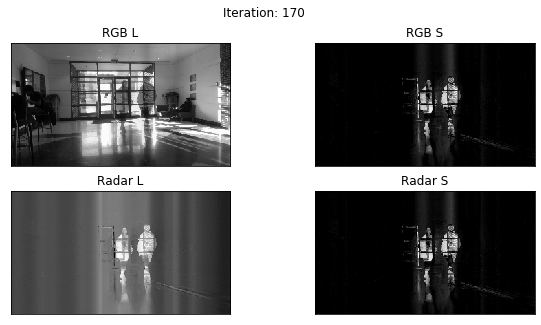

Image L rank:  12
Radar L rank:  11
Time:  0.04872298240661621
Iteration:  171
Image L rank:  12
Radar L rank:  12
Time:  0.04910850524902344
Iteration:  172
Image L rank:  12
Radar L rank:  12
Time:  0.04994606971740723
Iteration:  173
Image L rank:  12
Radar L rank:  12
Time:  0.05170893669128418
Iteration:  174
Image L rank:  12
Radar L rank:  12
Time:  0.05059194564819336
Iteration:  175
Image L rank:  12
Radar L rank:  12
Time:  0.05063676834106445
Iteration:  176
Image L rank:  13
Radar L rank:  12
Time:  0.056151628494262695
Iteration:  177
Image L rank:  12
Radar L rank:  12
Time:  0.05008745193481445
Iteration:  178
Image L rank:  12
Radar L rank:  12
Time:  0.04997658729553223
Iteration:  179
Image L rank:  12
Radar L rank:  12
Time:  0.04988718032836914
Iteration:  180


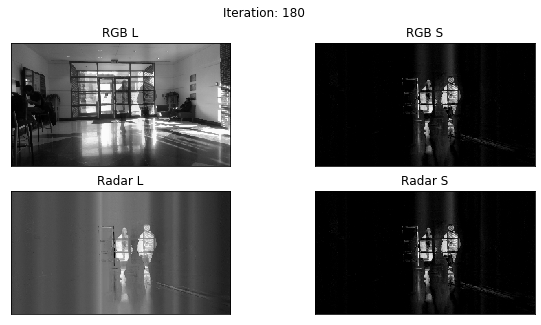

Image L rank:  12
Radar L rank:  12
Time:  0.048810720443725586
Iteration:  181
Image L rank:  12
Radar L rank:  12
Time:  0.05223846435546875
Iteration:  182
Image L rank:  12
Radar L rank:  12
Time:  0.049835205078125
Iteration:  183
Image L rank:  13
Radar L rank:  13
Time:  0.05624651908874512
Iteration:  184
Image L rank:  12
Radar L rank:  12
Time:  0.05015420913696289
Iteration:  185
Image L rank:  12
Radar L rank:  12
Time:  0.05095386505126953
Iteration:  186
Image L rank:  12
Radar L rank:  13
Time:  0.050795793533325195
Iteration:  187
Image L rank:  13
Radar L rank:  12
Time:  0.056934356689453125
Iteration:  188
Image L rank:  12
Radar L rank:  12
Time:  0.05037403106689453
Iteration:  189
Image L rank:  12
Radar L rank:  12
Time:  0.05034637451171875
Iteration:  190


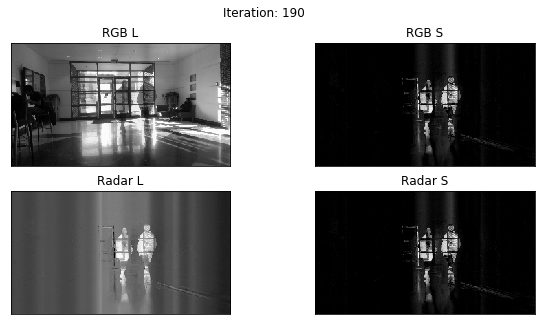

Image L rank:  12
Radar L rank:  12
Time:  0.04912447929382324
Iteration:  191
Image L rank:  11
Radar L rank:  11
Time:  0.046372413635253906
Iteration:  192
Image L rank:  12
Radar L rank:  12
Time:  0.051677703857421875
Iteration:  193
Image L rank:  12
Radar L rank:  12
Time:  0.050692081451416016
Iteration:  194
Image L rank:  12
Radar L rank:  12
Time:  0.05052828788757324
Iteration:  195
Image L rank:  12
Radar L rank:  12
Time:  0.05072522163391113
Iteration:  196
Image L rank:  12
Radar L rank:  12
Time:  0.05066514015197754
Iteration:  197
Image L rank:  12
Radar L rank:  12
Time:  0.05071592330932617
Iteration:  198
Image L rank:  12
Radar L rank:  11
Time:  0.05046367645263672
Iteration:  199
Image L rank:  12
Radar L rank:  13
Time:  0.05062079429626465
Iteration:  200


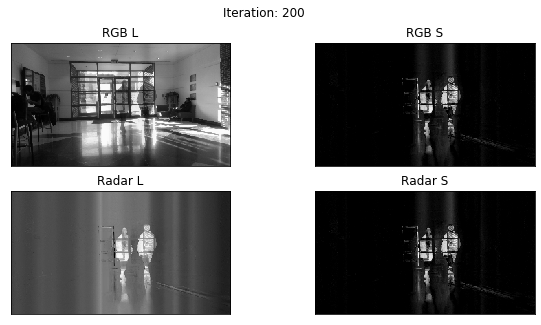

Image L rank:  12
Radar L rank:  12
Time:  0.04895281791687012
Iteration:  201
Image L rank:  12
Radar L rank:  12
Time:  0.053175926208496094
Iteration:  202
Image L rank:  12
Radar L rank:  12
Time:  0.05037045478820801
Iteration:  203
Image L rank:  12
Radar L rank:  12
Time:  0.05038642883300781
Iteration:  204
Image L rank:  12
Radar L rank:  12
Time:  0.05126357078552246
Iteration:  205
Image L rank:  13
Radar L rank:  13
Time:  0.0570988655090332
Iteration:  206
Image L rank:  12
Radar L rank:  12
Time:  0.05037355422973633
Iteration:  207
Image L rank:  13
Radar L rank:  12
Time:  0.05644941329956055
Iteration:  208
Image L rank:  12
Radar L rank:  12
Time:  0.05022168159484863
Iteration:  209
Image L rank:  12
Radar L rank:  12
Time:  0.050849199295043945
Iteration:  210


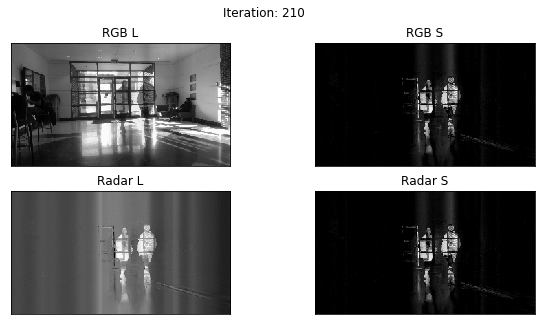

Image L rank:  12
Radar L rank:  12
Time:  0.048795461654663086
Iteration:  211
Image L rank:  12
Radar L rank:  12
Time:  0.05068802833557129
Iteration:  212
Image L rank:  12
Radar L rank:  12
Time:  0.05059456825256348
Iteration:  213
Image L rank:  12
Radar L rank:  12
Time:  0.050972938537597656
Iteration:  214
Image L rank:  12
Radar L rank:  13
Time:  0.050940752029418945
Iteration:  215
Image L rank:  12
Radar L rank:  13
Time:  0.0508732795715332
Iteration:  216
Image L rank:  12
Radar L rank:  12
Time:  0.05091094970703125
Iteration:  217
Image L rank:  12
Radar L rank:  12
Time:  0.051316022872924805
Iteration:  218
Image L rank:  12
Radar L rank:  13
Time:  0.051580190658569336
Iteration:  219
Image L rank:  12
Radar L rank:  12
Time:  0.05099058151245117
Iteration:  220


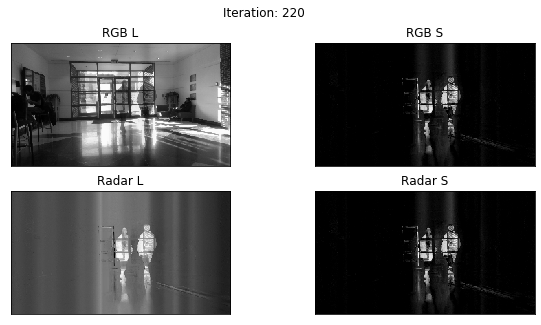

Image L rank:  12
Radar L rank:  12
Time:  0.048665761947631836
Iteration:  221
Image L rank:  12
Radar L rank:  13
Time:  0.05375266075134277
Iteration:  222
Image L rank:  12
Radar L rank:  12
Time:  0.05086541175842285
Iteration:  223
Image L rank:  12
Radar L rank:  12
Time:  0.05106544494628906
Iteration:  224
Image L rank:  12
Radar L rank:  12
Time:  0.05188918113708496
Iteration:  225
Image L rank:  12
Radar L rank:  12
Time:  0.05125856399536133
Iteration:  226
Image L rank:  12
Radar L rank:  13
Time:  0.05166316032409668
Iteration:  227
Image L rank:  12
Radar L rank:  12
Time:  0.05123567581176758
Iteration:  228
Image L rank:  12
Radar L rank:  12
Time:  0.05153632164001465
Iteration:  229
Image L rank:  12
Radar L rank:  12
Time:  0.05164146423339844
Iteration:  230


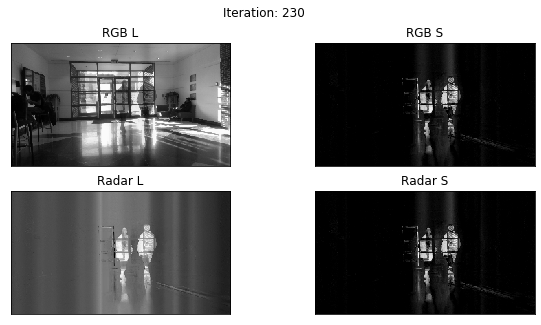

Image L rank:  12
Radar L rank:  12
Time:  0.05058789253234863
Iteration:  231
Image L rank:  12
Radar L rank:  12
Time:  0.05025601387023926
Iteration:  232
Image L rank:  12
Radar L rank:  13
Time:  0.05063223838806152
Iteration:  233
Image L rank:  12
Radar L rank:  13
Time:  0.05242490768432617
Iteration:  234
Image L rank:  13
Radar L rank:  12
Time:  0.057340145111083984
Iteration:  235
Image L rank:  12
Radar L rank:  13
Time:  0.05119156837463379
Iteration:  236
Image L rank:  12
Radar L rank:  13
Time:  0.051253557205200195
Iteration:  237
Image L rank:  12
Radar L rank:  12
Time:  0.05109047889709473
Iteration:  238
Image L rank:  12
Radar L rank:  12
Time:  0.051256656646728516
Iteration:  239
Image L rank:  12
Radar L rank:  13
Time:  0.05257105827331543
Iteration:  240


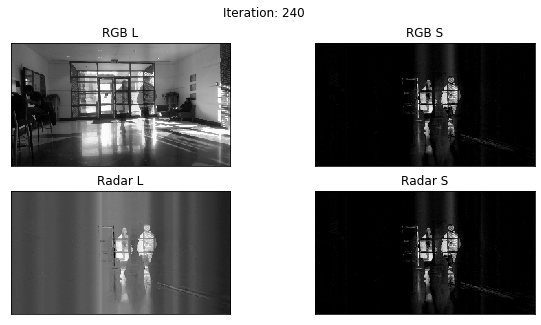

Image L rank:  12
Radar L rank:  12
Time:  0.04883837699890137
Iteration:  241
Image L rank:  12
Radar L rank:  13
Time:  0.05142068862915039
Iteration:  242
Image L rank:  12
Radar L rank:  12
Time:  0.05095338821411133
Iteration:  243
Image L rank:  12
Radar L rank:  12
Time:  0.051309823989868164
Iteration:  244
Image L rank:  12
Radar L rank:  13
Time:  0.050914764404296875
Iteration:  245
Image L rank:  12
Radar L rank:  12
Time:  0.05220818519592285
Iteration:  246
Image L rank:  12
Radar L rank:  13
Time:  0.05301785469055176
Iteration:  247
Image L rank:  12
Radar L rank:  12
Time:  0.05218052864074707
Iteration:  248
Image L rank:  12
Radar L rank:  12
Time:  0.050988197326660156
Iteration:  249
Image L rank:  13
Radar L rank:  12
Time:  0.057379722595214844
Iteration:  250


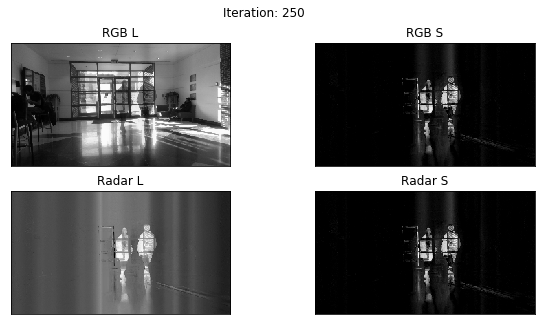

Image L rank:  12
Radar L rank:  12
Time:  0.04859662055969238
Iteration:  251
Image L rank:  12
Radar L rank:  12
Time:  0.05031132698059082
Iteration:  252
Image L rank:  12
Radar L rank:  12
Time:  0.05064749717712402
Iteration:  253
Image L rank:  12
Radar L rank:  12
Time:  0.05161285400390625
Iteration:  254
Image L rank:  12
Radar L rank:  12
Time:  0.05063033103942871
Iteration:  255
Image L rank:  12
Radar L rank:  12
Time:  0.0507662296295166
Iteration:  256
Image L rank:  12
Radar L rank:  12
Time:  0.05064821243286133
Iteration:  257
Image L rank:  12
Radar L rank:  13
Time:  0.05600547790527344
Iteration:  258
Image L rank:  13
Radar L rank:  12
Time:  0.05737423896789551
Iteration:  259
Image L rank:  12
Radar L rank:  12
Time:  0.05100440979003906
Iteration:  260


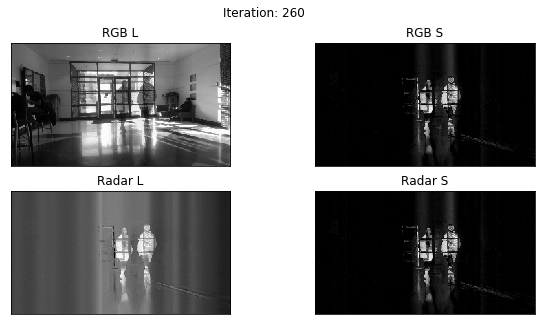

Image L rank:  12
Radar L rank:  12
Time:  0.05357074737548828
Iteration:  261
Image L rank:  12
Radar L rank:  12
Time:  0.050809383392333984
Iteration:  262
Image L rank:  12
Radar L rank:  13
Time:  0.051125526428222656
Iteration:  263
Image L rank:  12
Radar L rank:  12
Time:  0.05057644844055176
Iteration:  264
Image L rank:  12
Radar L rank:  12
Time:  0.05088925361633301
Iteration:  265
Image L rank:  13
Radar L rank:  12
Time:  0.05711627006530762
Iteration:  266
Image L rank:  12
Radar L rank:  13
Time:  0.060903310775756836
Iteration:  267
Image L rank:  12
Radar L rank:  12
Time:  0.290285587310791
Iteration:  268
Image L rank:  12
Radar L rank:  12
Time:  0.3962728977203369
Iteration:  269
Image L rank:  12
Radar L rank:  12
Time:  0.6280438899993896
Iteration:  270


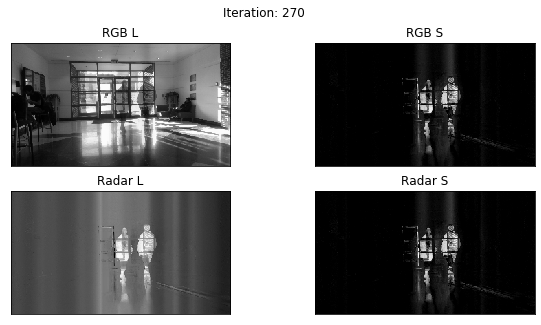

Image L rank:  12
Radar L rank:  12
Time:  0.053923845291137695
Iteration:  271
Image L rank:  12
Radar L rank:  12
Time:  0.05294966697692871
Iteration:  272
Image L rank:  12
Radar L rank:  12
Time:  0.04998016357421875
Iteration:  273
Image L rank:  12
Radar L rank:  13
Time:  0.049292802810668945
Iteration:  274
Image L rank:  12
Radar L rank:  12
Time:  0.04822969436645508
Iteration:  275
Image L rank:  12
Radar L rank:  12
Time:  0.04923677444458008
Iteration:  276
Image L rank:  12
Radar L rank:  12
Time:  0.04950070381164551
Iteration:  277
Image L rank:  12
Radar L rank:  12
Time:  0.04947662353515625
Iteration:  278
Image L rank:  12
Radar L rank:  12
Time:  0.049335479736328125
Iteration:  279
Image L rank:  12
Radar L rank:  13
Time:  0.05002784729003906
Iteration:  280


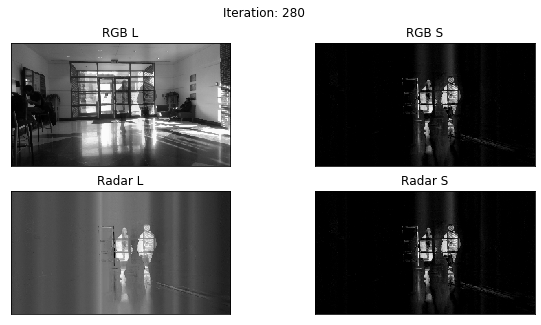

Image L rank:  12
Radar L rank:  12
Time:  0.04779505729675293
Iteration:  281
Image L rank:  12
Radar L rank:  12
Time:  0.04945492744445801
Iteration:  282
Image L rank:  12
Radar L rank:  12
Time:  0.04937243461608887
Iteration:  283
Image L rank:  12
Radar L rank:  12
Time:  0.049976348876953125
Iteration:  284
Image L rank:  12
Radar L rank:  12
Time:  0.04996156692504883
Iteration:  285
Image L rank:  12
Radar L rank:  12
Time:  0.049964189529418945
Iteration:  286
Image L rank:  12
Radar L rank:  12
Time:  0.05027008056640625
Iteration:  287
Image L rank:  12
Radar L rank:  12
Time:  0.050505638122558594
Iteration:  288
Image L rank:  12
Radar L rank:  12
Time:  0.0501859188079834
Iteration:  289
Image L rank:  12
Radar L rank:  13
Time:  0.05014300346374512
Iteration:  290


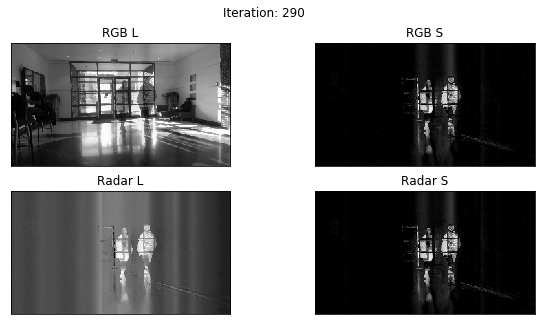

Image L rank:  12
Radar L rank:  12
Time:  0.04822587966918945
Iteration:  291
Image L rank:  12
Radar L rank:  12
Time:  0.05054974555969238
Iteration:  292
Image L rank:  12
Radar L rank:  12
Time:  0.050116539001464844
Iteration:  293
Image L rank:  12
Radar L rank:  12
Time:  0.05064272880554199
Iteration:  294
Image L rank:  12
Radar L rank:  12
Time:  0.050475358963012695
Iteration:  295
Image L rank:  12
Radar L rank:  13
Time:  0.05016946792602539
Iteration:  296
Image L rank:  12
Radar L rank:  12
Time:  0.05013132095336914
Iteration:  297
Image L rank:  12
Radar L rank:  12
Time:  0.05001950263977051
Iteration:  298
Image L rank:  11
Radar L rank:  12
Time:  0.047246694564819336
Iteration:  299
Image L rank:  12
Radar L rank:  12
Time:  0.060959815979003906
Iteration:  300


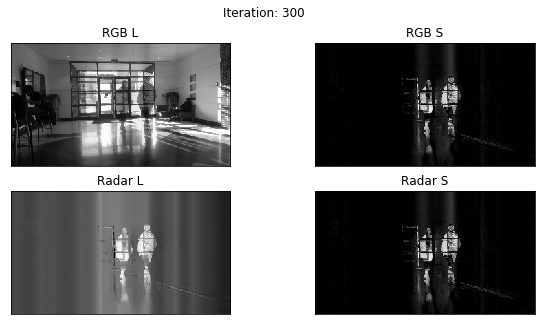

Image L rank:  12
Radar L rank:  12
Time:  0.04836535453796387
Iteration:  301
Image L rank:  12
Radar L rank:  12
Time:  0.05101180076599121
Iteration:  302
Image L rank:  12
Radar L rank:  12
Time:  0.051156044006347656
Iteration:  303
Image L rank:  12
Radar L rank:  12
Time:  0.050737857818603516
Iteration:  304
Image L rank:  12
Radar L rank:  12
Time:  0.051621198654174805
Iteration:  305
Image L rank:  12
Radar L rank:  12
Time:  0.05127263069152832
Iteration:  306
Image L rank:  12
Radar L rank:  13
Time:  0.05088400840759277
Iteration:  307
Image L rank:  13
Radar L rank:  13
Time:  0.056936025619506836
Iteration:  308
Image L rank:  12
Radar L rank:  12
Time:  0.05050301551818848
Iteration:  309
Image L rank:  12
Radar L rank:  12
Time:  0.05185294151306152
Iteration:  310


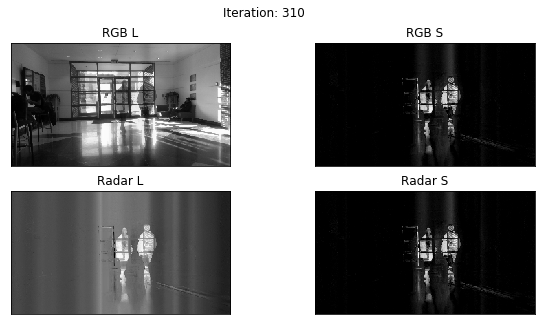

Image L rank:  13
Radar L rank:  13
Time:  0.05787396430969238
Iteration:  311
Image L rank:  12
Radar L rank:  12
Time:  0.05066251754760742
Iteration:  312
Image L rank:  12
Radar L rank:  13
Time:  0.05043816566467285
Iteration:  313
Image L rank:  13
Radar L rank:  12
Time:  0.05673813819885254
Iteration:  314
Image L rank:  12
Radar L rank:  12
Time:  0.053107261657714844
Iteration:  315
Image L rank:  12
Radar L rank:  13
Time:  0.05098223686218262
Iteration:  316
Image L rank:  12
Radar L rank:  12
Time:  0.0502324104309082
Iteration:  317
Image L rank:  12
Radar L rank:  12
Time:  0.050608158111572266
Iteration:  318
Image L rank:  12
Radar L rank:  12
Time:  0.05093097686767578
Iteration:  319
Image L rank:  12
Radar L rank:  12
Time:  0.05082225799560547
Iteration:  320


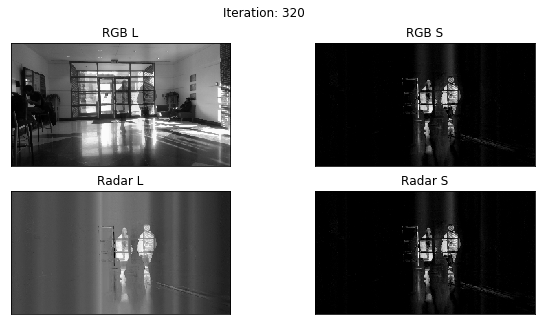

Image L rank:  12
Radar L rank:  12
Time:  0.0481877326965332
Iteration:  321
Image L rank:  12
Radar L rank:  12
Time:  0.05070018768310547
Iteration:  322
Image L rank:  12
Radar L rank:  12
Time:  0.050443410873413086
Iteration:  323
Image L rank:  12
Radar L rank:  12
Time:  0.05077409744262695
Iteration:  324
Image L rank:  12
Radar L rank:  12
Time:  0.050276756286621094
Iteration:  325
Image L rank:  13
Radar L rank:  12
Time:  0.05686664581298828
Iteration:  326
Image L rank:  12
Radar L rank:  12
Time:  0.05072212219238281
Iteration:  327
Image L rank:  12
Radar L rank:  12
Time:  0.05072498321533203
Iteration:  328
Image L rank:  13
Radar L rank:  12
Time:  0.05709338188171387
Iteration:  329
Image L rank:  12
Radar L rank:  12
Time:  0.05050325393676758
Iteration:  330


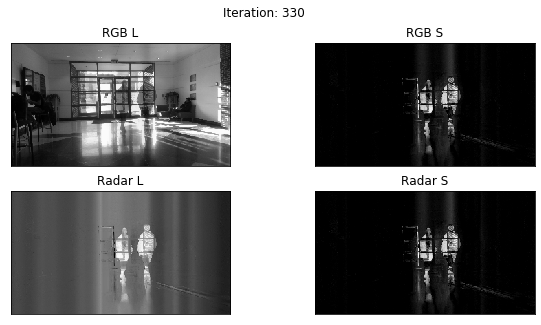

Image L rank:  12
Radar L rank:  12
Time:  0.05177187919616699
Iteration:  331
Image L rank:  12
Radar L rank:  12
Time:  0.05075335502624512
Iteration:  332
Image L rank:  12
Radar L rank:  12
Time:  0.05087542533874512
Iteration:  333
Image L rank:  12
Radar L rank:  12
Time:  0.051107168197631836
Iteration:  334
Image L rank:  12
Radar L rank:  12
Time:  0.05121445655822754
Iteration:  335
Image L rank:  12
Radar L rank:  12
Time:  0.050607919692993164
Iteration:  336
Image L rank:  12
Radar L rank:  12
Time:  0.051091670989990234
Iteration:  337
Image L rank:  12
Radar L rank:  12
Time:  0.05091691017150879
Iteration:  338
Image L rank:  12
Radar L rank:  12
Time:  0.0508882999420166
Iteration:  339
Image L rank:  12
Radar L rank:  12
Time:  0.05096936225891113
Iteration:  340


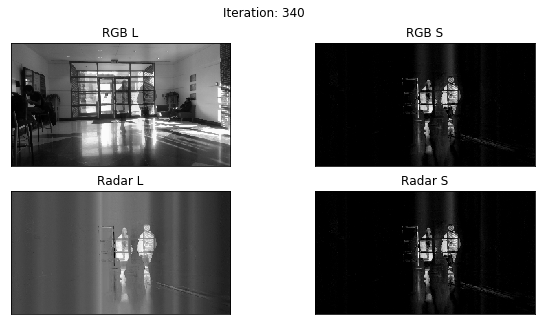

Image L rank:  12
Radar L rank:  12
Time:  0.04848146438598633
Iteration:  341
Image L rank:  13
Radar L rank:  12
Time:  0.05743861198425293
Iteration:  342
Image L rank:  12
Radar L rank:  13
Time:  0.05164742469787598
Iteration:  343
Image L rank:  12
Radar L rank:  12
Time:  0.05066800117492676
Iteration:  344
Image L rank:  12
Radar L rank:  12
Time:  0.050908803939819336
Iteration:  345
Image L rank:  12
Radar L rank:  12
Time:  0.05053973197937012
Iteration:  346
Image L rank:  12
Radar L rank:  12
Time:  0.053032875061035156
Iteration:  347
Image L rank:  12
Radar L rank:  12
Time:  0.05099225044250488
Iteration:  348
Image L rank:  12
Radar L rank:  13
Time:  0.05063366889953613
Iteration:  349
Image L rank:  12
Radar L rank:  12
Time:  0.0510866641998291
Iteration:  350


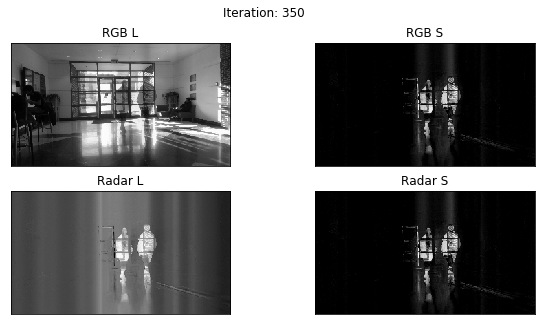

Image L rank:  12
Radar L rank:  12
Time:  0.04933953285217285
Iteration:  351
Image L rank:  12
Radar L rank:  13
Time:  0.050652503967285156
Iteration:  352
Image L rank:  13
Radar L rank:  12
Time:  0.05703592300415039
Iteration:  353
Image L rank:  12
Radar L rank:  13
Time:  0.05105710029602051
Iteration:  354
Image L rank:  13
Radar L rank:  13
Time:  0.06029319763183594
Iteration:  355
Image L rank:  12
Radar L rank:  13
Time:  0.05118894577026367
Iteration:  356
Image L rank:  12
Radar L rank:  12
Time:  0.05099654197692871
Iteration:  357
Image L rank:  12
Radar L rank:  13
Time:  0.05530285835266113
Iteration:  358
Image L rank:  13
Radar L rank:  12
Time:  0.07308030128479004
Iteration:  359
Image L rank:  12
Radar L rank:  12
Time:  0.05037808418273926
Iteration:  360


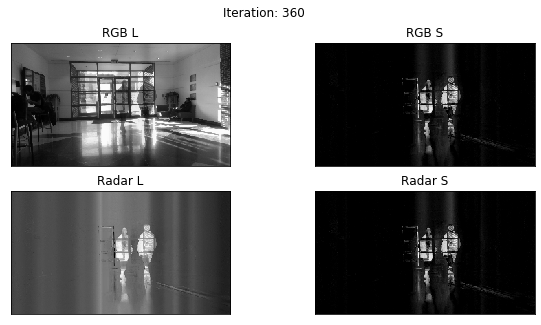

Image L rank:  11
Radar L rank:  12
Time:  0.05953550338745117
Iteration:  361
Image L rank:  12
Radar L rank:  12
Time:  0.05265641212463379
Iteration:  362
Image L rank:  12
Radar L rank:  12
Time:  0.052484989166259766
Iteration:  363
Image L rank:  12
Radar L rank:  12
Time:  0.05090904235839844
Iteration:  364
Image L rank:  12
Radar L rank:  12
Time:  0.05135512351989746
Iteration:  365
Image L rank:  12
Radar L rank:  12
Time:  0.06119585037231445
Iteration:  366
Image L rank:  12
Radar L rank:  12
Time:  0.3452627658843994
Iteration:  367
Image L rank:  12
Radar L rank:  12
Time:  0.8526806831359863
Iteration:  368
Image L rank:  12
Radar L rank:  12
Time:  0.8319573402404785
Iteration:  369
Image L rank:  12
Radar L rank:  12
Time:  0.11154580116271973
Iteration:  370


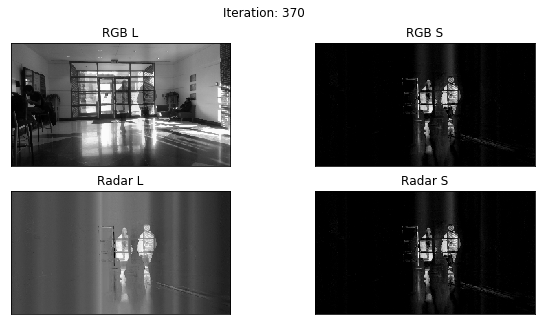

Image L rank:  12
Radar L rank:  13
Time:  0.05529642105102539
Iteration:  371
Image L rank:  12
Radar L rank:  12
Time:  0.04967045783996582
Iteration:  372
Image L rank:  12
Radar L rank:  12
Time:  0.04949450492858887
Iteration:  373
Image L rank:  12
Radar L rank:  12
Time:  0.049974918365478516
Iteration:  374
Image L rank:  12
Radar L rank:  12
Time:  0.05464577674865723
Iteration:  375
Image L rank:  12
Radar L rank:  12
Time:  0.04978799819946289
Iteration:  376
Image L rank:  13
Radar L rank:  13
Time:  0.05694150924682617
Iteration:  377
Image L rank:  12
Radar L rank:  12
Time:  0.04999804496765137
Iteration:  378
Image L rank:  12
Radar L rank:  12
Time:  0.05728340148925781
Iteration:  379
Image L rank:  13
Radar L rank:  13
Time:  0.05703997611999512
Iteration:  380


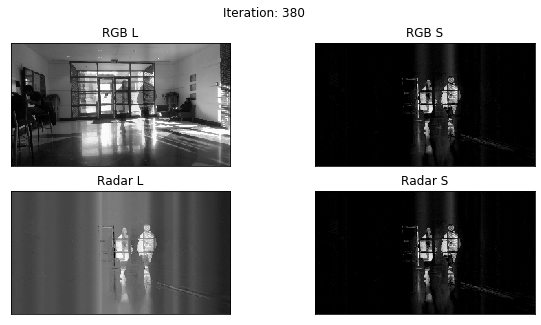

Image L rank:  12
Radar L rank:  13
Time:  0.04862546920776367
Iteration:  381
Image L rank:  12
Radar L rank:  12
Time:  0.05028796195983887
Iteration:  382
Image L rank:  12
Radar L rank:  12
Time:  0.050283193588256836
Iteration:  383
Image L rank:  12
Radar L rank:  12
Time:  0.0507967472076416
Iteration:  384
Image L rank:  13
Radar L rank:  13
Time:  0.057797908782958984
Iteration:  385
Image L rank:  12
Radar L rank:  12
Time:  0.05041861534118652
Iteration:  386
Image L rank:  13
Radar L rank:  13
Time:  0.05917978286743164
Iteration:  387
Image L rank:  12
Radar L rank:  12
Time:  0.050682783126831055
Iteration:  388
Image L rank:  12
Radar L rank:  12
Time:  0.05103898048400879
Iteration:  389
Image L rank:  13
Radar L rank:  12
Time:  0.05752444267272949
Iteration:  390


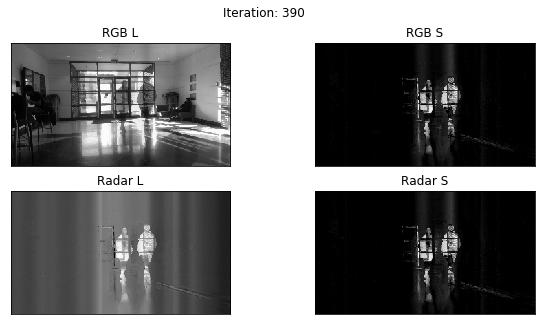

Image L rank:  12
Radar L rank:  12
Time:  0.04837155342102051
Iteration:  391
Image L rank:  12
Radar L rank:  13
Time:  0.05141162872314453
Iteration:  392
Image L rank:  12
Radar L rank:  12
Time:  0.052803754806518555
Iteration:  393
Image L rank:  12
Radar L rank:  12
Time:  0.052557945251464844
Iteration:  394
Image L rank:  12
Radar L rank:  12
Time:  0.05257868766784668
Iteration:  395
Image L rank:  12
Radar L rank:  12
Time:  0.05269479751586914
Iteration:  396
Image L rank:  13
Radar L rank:  12
Time:  0.05742168426513672
Iteration:  397
Image L rank:  12
Radar L rank:  12
Time:  0.05124020576477051
Iteration:  398
Image L rank:  12
Radar L rank:  12
Time:  0.05108332633972168
Iteration:  399
Image L rank:  12
Radar L rank:  12
Time:  0.05110907554626465
Iteration:  400


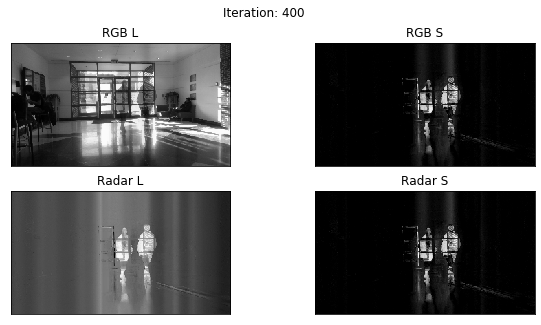

Image L rank:  13
Radar L rank:  12
Time:  0.05609774589538574
Iteration:  401
Image L rank:  12
Radar L rank:  12
Time:  0.05207109451293945
Iteration:  402
Image L rank:  12
Radar L rank:  12
Time:  0.05154061317443848
Iteration:  403
Image L rank:  12
Radar L rank:  12
Time:  0.05150413513183594
Iteration:  404
Image L rank:  12
Radar L rank:  12
Time:  0.05081939697265625
Iteration:  405
Image L rank:  12
Radar L rank:  12
Time:  0.051650285720825195
Iteration:  406
Image L rank:  12
Radar L rank:  12
Time:  0.0514528751373291
Iteration:  407
Image L rank:  12
Radar L rank:  11
Time:  0.05126762390136719
Iteration:  408
Image L rank:  12
Radar L rank:  12
Time:  0.05217099189758301
Iteration:  409
Image L rank:  12
Radar L rank:  12
Time:  0.05338931083679199
Iteration:  410


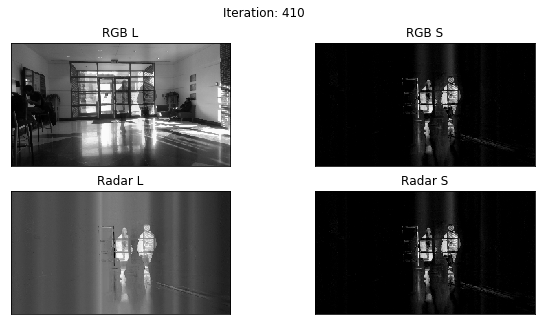

Image L rank:  12
Radar L rank:  12
Time:  0.0490717887878418
Iteration:  411
Image L rank:  12
Radar L rank:  12
Time:  0.05170607566833496
Iteration:  412
Image L rank:  12
Radar L rank:  12
Time:  0.051671504974365234
Iteration:  413
Image L rank:  12
Radar L rank:  12
Time:  0.05156826972961426
Iteration:  414
Image L rank:  12
Radar L rank:  12
Time:  0.05177903175354004
Iteration:  415
Image L rank:  12
Radar L rank:  12
Time:  0.05184054374694824
Iteration:  416
Image L rank:  12
Radar L rank:  13
Time:  0.05144166946411133
Iteration:  417
Image L rank:  12
Radar L rank:  13
Time:  0.05153322219848633
Iteration:  418
Image L rank:  12
Radar L rank:  12
Time:  0.0513763427734375
Iteration:  419
Image L rank:  12
Radar L rank:  13
Time:  0.05198955535888672
Iteration:  420


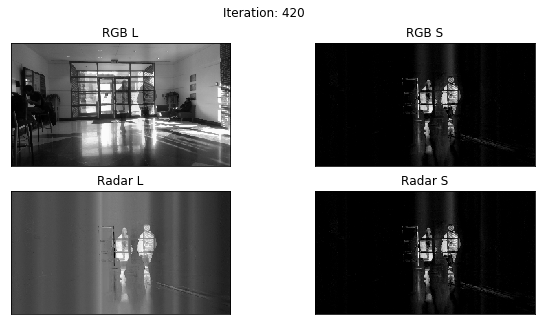

Image L rank:  12
Radar L rank:  12
Time:  0.053934574127197266
Iteration:  421
Image L rank:  12
Radar L rank:  12
Time:  0.05067181587219238
Iteration:  422
Image L rank:  12
Radar L rank:  12
Time:  0.050629377365112305
Iteration:  423
Image L rank:  13
Radar L rank:  12
Time:  0.05823636054992676
Iteration:  424
Image L rank:  12
Radar L rank:  12
Time:  0.05110907554626465
Iteration:  425
Image L rank:  12
Radar L rank:  12
Time:  0.05051064491271973
Iteration:  426
Image L rank:  12
Radar L rank:  12
Time:  0.05097031593322754
Iteration:  427
Image L rank:  12
Radar L rank:  12
Time:  0.05067777633666992
Iteration:  428
Image L rank:  12
Radar L rank:  12
Time:  0.05170273780822754
Iteration:  429
Image L rank:  13
Radar L rank:  13
Time:  0.05742979049682617
Iteration:  430


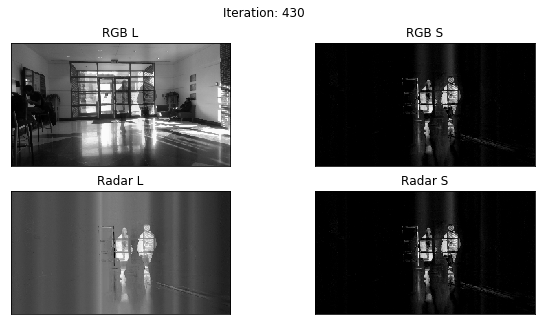

Image L rank:  12
Radar L rank:  12
Time:  0.048256635665893555
Iteration:  431
Image L rank:  12
Radar L rank:  12
Time:  0.050870418548583984
Iteration:  432
Image L rank:  12
Radar L rank:  13
Time:  0.052453041076660156
Iteration:  433
Image L rank:  13
Radar L rank:  13
Time:  0.05733036994934082
Iteration:  434
Image L rank:  13
Radar L rank:  12
Time:  0.0570521354675293
Iteration:  435
Image L rank:  12
Radar L rank:  12
Time:  0.05074000358581543
Iteration:  436
Image L rank:  12
Radar L rank:  12
Time:  0.051302194595336914
Iteration:  437
Image L rank:  12
Radar L rank:  13
Time:  0.05094122886657715
Iteration:  438
Image L rank:  13
Radar L rank:  12
Time:  0.05724453926086426
Iteration:  439
Image L rank:  12
Radar L rank:  12
Time:  0.05074739456176758
Iteration:  440


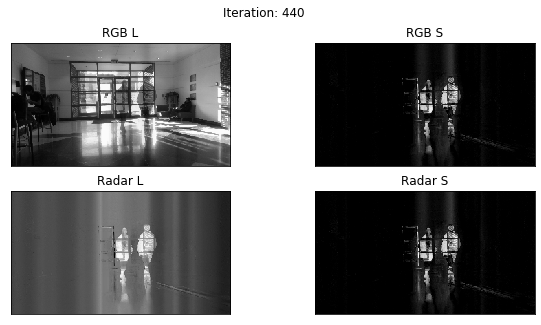

Image L rank:  12
Radar L rank:  12
Time:  0.04839372634887695
Iteration:  441
Image L rank:  12
Radar L rank:  13
Time:  0.05112409591674805
Iteration:  442
Image L rank:  12
Radar L rank:  12
Time:  0.050859928131103516
Iteration:  443
Image L rank:  12
Radar L rank:  12
Time:  0.050980329513549805
Iteration:  444
Image L rank:  12
Radar L rank:  12
Time:  0.052941083908081055
Iteration:  445
Image L rank:  12
Radar L rank:  13
Time:  0.051020145416259766
Iteration:  446
Image L rank:  12
Radar L rank:  12
Time:  0.051403045654296875
Iteration:  447
Image L rank:  12
Radar L rank:  12
Time:  0.0515289306640625
Iteration:  448
Image L rank:  12
Radar L rank:  12
Time:  0.05177783966064453
Iteration:  449
Image L rank:  12
Radar L rank:  12
Time:  0.051049232482910156
Iteration:  450


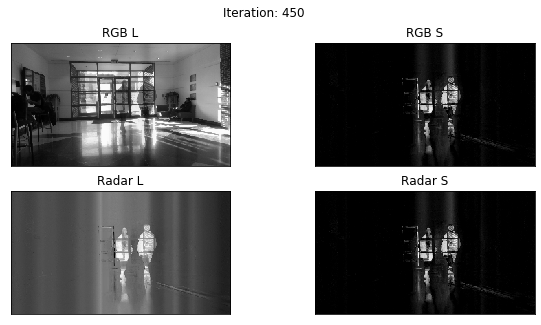

Image L rank:  13
Radar L rank:  12
Time:  0.057312726974487305
Iteration:  451
Image L rank:  12
Radar L rank:  12
Time:  0.05057954788208008
Iteration:  452
Image L rank:  12
Radar L rank:  12
Time:  0.05095243453979492
Iteration:  453
Image L rank:  12
Radar L rank:  12
Time:  0.05118417739868164
Iteration:  454
Image L rank:  11
Radar L rank:  12
Time:  0.047540903091430664
Iteration:  455
Image L rank:  12
Radar L rank:  12
Time:  0.0524444580078125
Iteration:  456
Image L rank:  12
Radar L rank:  12
Time:  0.05056142807006836
Iteration:  457
Image L rank:  12
Radar L rank:  12
Time:  0.05092954635620117
Iteration:  458
Image L rank:  12
Radar L rank:  12
Time:  0.05103874206542969
Iteration:  459
Image L rank:  12
Radar L rank:  12
Time:  0.05134105682373047
Iteration:  460


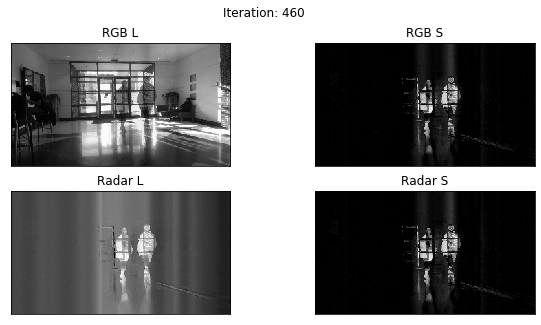

Image L rank:  12
Radar L rank:  12
Time:  0.056182146072387695
Iteration:  461
Image L rank:  12
Radar L rank:  12
Time:  0.050780296325683594
Iteration:  462
Image L rank:  12
Radar L rank:  12
Time:  0.051093101501464844
Iteration:  463
Image L rank:  13
Radar L rank:  12
Time:  0.05755972862243652
Iteration:  464
Image L rank:  12
Radar L rank:  12
Time:  0.05123615264892578
Iteration:  465
Image L rank:  12
Radar L rank:  12
Time:  0.05116748809814453
Iteration:  466
Image L rank:  12
Radar L rank:  13
Time:  0.051239728927612305
Iteration:  467
Image L rank:  12
Radar L rank:  12
Time:  0.050748348236083984
Iteration:  468
Image L rank:  12
Radar L rank:  12
Time:  0.05145549774169922
Iteration:  469
Image L rank:  12
Radar L rank:  12
Time:  0.0746304988861084
Iteration:  470


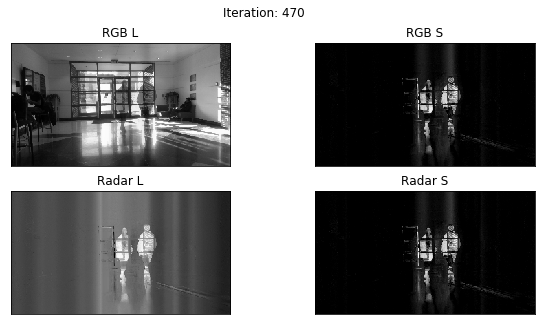

Image L rank:  12
Radar L rank:  12
Time:  0.7051470279693604
Iteration:  471
Image L rank:  11
Radar L rank:  12
Time:  0.12009453773498535
Iteration:  472
Image L rank:  12
Radar L rank:  12
Time:  0.05430245399475098
Iteration:  473
Image L rank:  13
Radar L rank:  12
Time:  0.05878090858459473
Iteration:  474
Image L rank:  12
Radar L rank:  12
Time:  0.04831409454345703
Iteration:  475
Image L rank:  12
Radar L rank:  12
Time:  0.04877591133117676
Iteration:  476
Image L rank:  12
Radar L rank:  12
Time:  0.04916071891784668
Iteration:  477
Image L rank:  12
Radar L rank:  12
Time:  0.049295902252197266
Iteration:  478
Image L rank:  12
Radar L rank:  12
Time:  0.049703359603881836
Iteration:  479
Image L rank:  12
Radar L rank:  12
Time:  0.049799203872680664
Iteration:  480


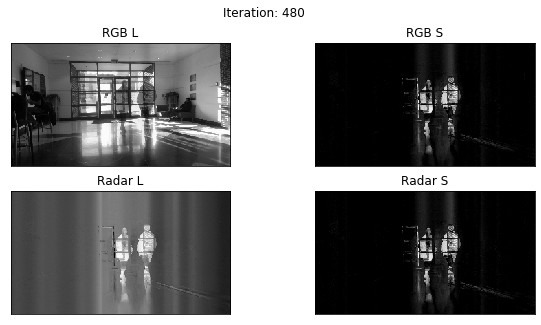

Image L rank:  12
Radar L rank:  12
Time:  0.04867672920227051
Iteration:  481
Image L rank:  12
Radar L rank:  12
Time:  0.04965567588806152
Iteration:  482
Image L rank:  12
Radar L rank:  12
Time:  0.0498502254486084
Iteration:  483
Image L rank:  13
Radar L rank:  12
Time:  0.05710172653198242
Iteration:  484
Image L rank:  13
Radar L rank:  12
Time:  0.0560603141784668
Iteration:  485
Image L rank:  12
Radar L rank:  12
Time:  0.04993009567260742
Iteration:  486
Image L rank:  12
Radar L rank:  12
Time:  0.04978752136230469
Iteration:  487
Image L rank:  12
Radar L rank:  12
Time:  0.04990696907043457
Iteration:  488
Image L rank:  12
Radar L rank:  12
Time:  0.04988694190979004
Iteration:  489
Image L rank:  12
Radar L rank:  12
Time:  0.05063652992248535
Iteration:  490


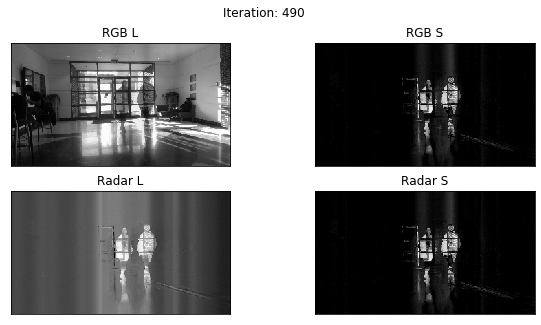

Image L rank:  13
Radar L rank:  12
Time:  0.05465364456176758
Iteration:  491
Image L rank:  12
Radar L rank:  12
Time:  0.04927635192871094
Iteration:  492
Image L rank:  12
Radar L rank:  12
Time:  0.050505638122558594
Iteration:  493
Image L rank:  13
Radar L rank:  12
Time:  0.056765079498291016
Iteration:  494
Image L rank:  12
Radar L rank:  12
Time:  0.049858808517456055
Iteration:  495
Image L rank:  12
Radar L rank:  13
Time:  0.05169272422790527
Iteration:  496
Image L rank:  12
Radar L rank:  12
Time:  0.05336880683898926
Iteration:  497
Image L rank:  12
Radar L rank:  12
Time:  0.050679683685302734
Iteration:  498


Image L rank:  12
Radar L rank:  12
Time:  0.05046987533569336
Iteration:  499


In [4]:
image_L, image_S, radar_L, radar_S, (u, s, v), errors, ranks, nnzs = joint_sum_ista(D, M_F, verbose=True, maxiter=500,
                                          plot_num=10,im_shape=[720//4,1280//4]) ##############

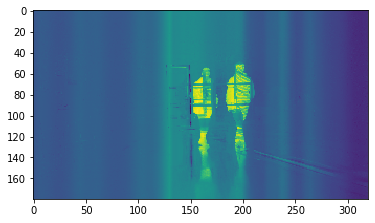

In [8]:
plt.imshow(radar_L[:,10].reshape(720//4,-1))######
plt.show()

mu = 0.6306509783844475
Image L rank:  50
Radar L rank:  34
Time:  0.07585954666137695
Iteration:  0


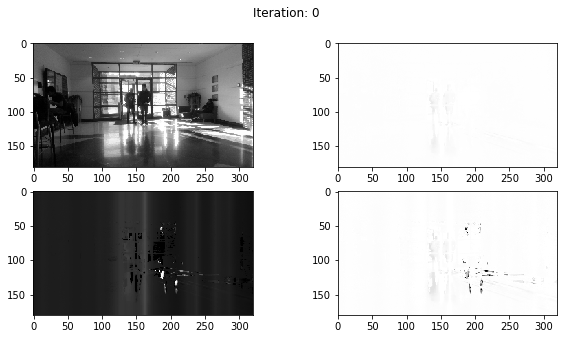

Image L rank:  29
Radar L rank:  26
Time:  0.14227676391601562
Iteration:  1
Image L rank:  25
Radar L rank:  23
Time:  0.11660504341125488
Iteration:  2
Image L rank:  24
Radar L rank:  19
Time:  0.10977792739868164
Iteration:  3
Image L rank:  20
Radar L rank:  16
Time:  0.09183454513549805
Iteration:  4
Image L rank:  17
Radar L rank:  14
Time:  0.11036872863769531
Iteration:  5
Image L rank:  15
Radar L rank:  11
Time:  0.09523487091064453
Iteration:  6
Image L rank:  12
Radar L rank:  12
Time:  0.06014752388000488
Iteration:  7
Image L rank:  13
Radar L rank:  14
Time:  0.10090827941894531
Iteration:  8
Image L rank:  15
Radar L rank:  16
Time:  0.07293963432312012
Iteration:  9
Image L rank:  17
Radar L rank:  18
Time:  0.08417391777038574
Iteration:  10


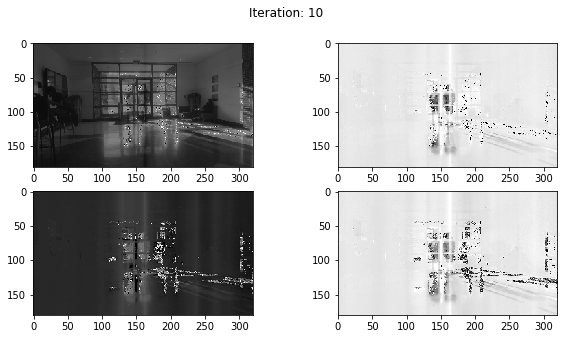

Image L rank:  19
Radar L rank:  20
Time:  0.09558367729187012
Iteration:  11
Image L rank:  21
Radar L rank:  22
Time:  0.09931659698486328
Iteration:  12
Image L rank:  23
Radar L rank:  24
Time:  0.1101069450378418
Iteration:  13
Image L rank:  25
Radar L rank:  26
Time:  0.11861896514892578
Iteration:  14
Image L rank:  27
Radar L rank:  28
Time:  0.12827062606811523
Iteration:  15
Image L rank:  29
Radar L rank:  30
Time:  0.1519911289215088
Iteration:  16
Image L rank:  31
Radar L rank:  32
Time:  0.130964994430542
Iteration:  17
Image L rank:  33
Radar L rank:  34
Time:  0.14299917221069336
Iteration:  18
Image L rank:  35
Radar L rank:  35
Time:  0.12892723083496094
Iteration:  19
Image L rank:  36
Radar L rank:  36
Time:  0.14223647117614746
Iteration:  20


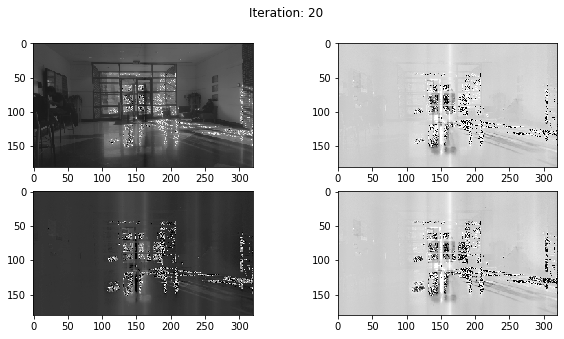

Image L rank:  37
Radar L rank:  37
Time:  0.08157038688659668
Iteration:  21
Image L rank:  38
Radar L rank:  38
Time:  0.07872176170349121
Iteration:  22
Image L rank:  39
Radar L rank:  39
Time:  0.09009695053100586
Iteration:  23
Image L rank:  40
Radar L rank:  40
Time:  0.08222675323486328
Iteration:  24
Image L rank:  41
Radar L rank:  41
Time:  0.08228230476379395
Iteration:  25
Image L rank:  42
Radar L rank:  42
Time:  0.07665777206420898
Iteration:  26
Image L rank:  43
Radar L rank:  43
Time:  0.07691192626953125
Iteration:  27
Image L rank:  44
Radar L rank:  44
Time:  0.07615876197814941
Iteration:  28
Image L rank:  45
Radar L rank:  45
Time:  0.07700943946838379
Iteration:  29
Image L rank:  46
Radar L rank:  46
Time:  0.07733464241027832
Iteration:  30


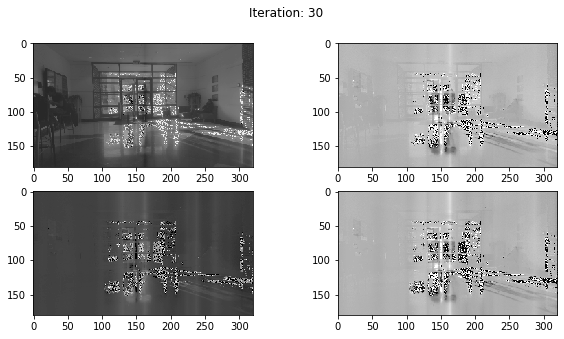

Image L rank:  47
Radar L rank:  47
Time:  0.07598280906677246
Iteration:  31
Image L rank:  48
Radar L rank:  48
Time:  0.07670021057128906
Iteration:  32
Image L rank:  49
Radar L rank:  49
Time:  0.07796287536621094
Iteration:  33
Image L rank:  50
Radar L rank:  50
Time:  0.09337711334228516
Iteration:  34
Image L rank:  50
Radar L rank:  50
Time:  0.0914604663848877
Iteration:  35
Image L rank:  50
Radar L rank:  50
Time:  0.0971076488494873
Iteration:  36
Image L rank:  50
Radar L rank:  50
Time:  0.07769179344177246
Iteration:  37
Image L rank:  50
Radar L rank:  50
Time:  0.09931230545043945
Iteration:  38
Image L rank:  50
Radar L rank:  50
Time:  0.08495402336120605
Iteration:  39
Image L rank:  50
Radar L rank:  50
Time:  0.10216474533081055
Iteration:  40


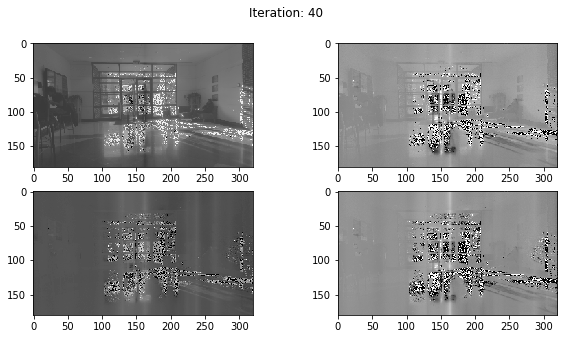

Image L rank:  50
Radar L rank:  50
Time:  0.08793091773986816
Iteration:  41
Image L rank:  50
Radar L rank:  50
Time:  0.08076286315917969
Iteration:  42
Image L rank:  50
Radar L rank:  50
Time:  0.07700586318969727
Iteration:  43
Image L rank:  50
Radar L rank:  50
Time:  0.08528923988342285
Iteration:  44
Image L rank:  50
Radar L rank:  50
Time:  0.07749724388122559
Iteration:  45
Image L rank:  50
Radar L rank:  50
Time:  0.07734537124633789
Iteration:  46
Image L rank:  50
Radar L rank:  50
Time:  0.07681083679199219
Iteration:  47
Image L rank:  50
Radar L rank:  50
Time:  0.07692432403564453
Iteration:  48
Image L rank:  50
Radar L rank:  50
Time:  0.0854949951171875
Iteration:  49
Image L rank:  50
Radar L rank:  50
Time:  0.07762432098388672
Iteration:  50


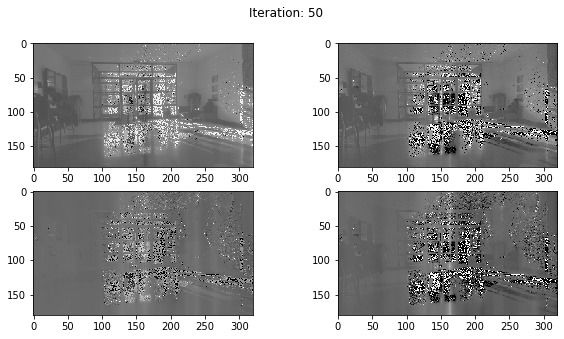

Image L rank:  50
Radar L rank:  50
Time:  0.07673215866088867
Iteration:  51
Image L rank:  50
Radar L rank:  50
Time:  0.09707856178283691
Iteration:  52
Image L rank:  50
Radar L rank:  50
Time:  0.09743571281433105
Iteration:  53
Image L rank:  50
Radar L rank:  50
Time:  0.07900333404541016
Iteration:  54
Image L rank:  50
Radar L rank:  50
Time:  0.1057126522064209
Iteration:  55
Image L rank:  50
Radar L rank:  50
Time:  0.08638811111450195
Iteration:  56
Image L rank:  50
Radar L rank:  50
Time:  0.08011746406555176
Iteration:  57
Image L rank:  50
Radar L rank:  50
Time:  0.08614087104797363
Iteration:  58
Image L rank:  50
Radar L rank:  50
Time:  0.07992672920227051
Iteration:  59
Image L rank:  50
Radar L rank:  50
Time:  0.0794832706451416
Iteration:  60


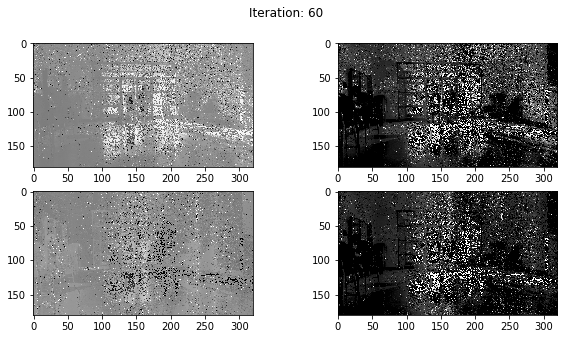

Image L rank:  50
Radar L rank:  50
Time:  0.08739066123962402
Iteration:  61
Image L rank:  50
Radar L rank:  50
Time:  0.08858323097229004
Iteration:  62
Image L rank:  50
Radar L rank:  50
Time:  0.08642363548278809
Iteration:  63
Image L rank:  50
Radar L rank:  50
Time:  0.07866334915161133
Iteration:  64
Image L rank:  50
Radar L rank:  50
Time:  0.08171296119689941
Iteration:  65
Image L rank:  50
Radar L rank:  50
Time:  0.08508539199829102
Iteration:  66
Image L rank:  50
Radar L rank:  50
Time:  0.08928418159484863
Iteration:  67
Image L rank:  50
Radar L rank:  50
Time:  0.0792686939239502
Iteration:  68
Image L rank:  50
Radar L rank:  50
Time:  0.08594703674316406
Iteration:  69
Image L rank:  50
Radar L rank:  50
Time:  0.08220863342285156
Iteration:  70


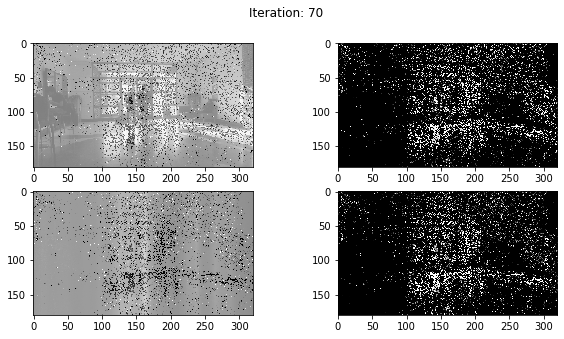

Image L rank:  50
Radar L rank:  50
Time:  0.09143829345703125
Iteration:  71
Image L rank:  50
Radar L rank:  50
Time:  0.08133840560913086
Iteration:  72
Image L rank:  50
Radar L rank:  50
Time:  0.08408784866333008
Iteration:  73
Image L rank:  50
Radar L rank:  50
Time:  0.08191061019897461
Iteration:  74
Image L rank:  50
Radar L rank:  50
Time:  0.08462381362915039
Iteration:  75
Image L rank:  50
Radar L rank:  50
Time:  0.07805371284484863
Iteration:  76
Image L rank:  50
Radar L rank:  50
Time:  0.07867789268493652
Iteration:  77
Image L rank:  50
Radar L rank:  50
Time:  0.07954287528991699
Iteration:  78
Image L rank:  50
Radar L rank:  50
Time:  0.07787132263183594
Iteration:  79
Image L rank:  50
Radar L rank:  50
Time:  0.08536219596862793
Iteration:  80


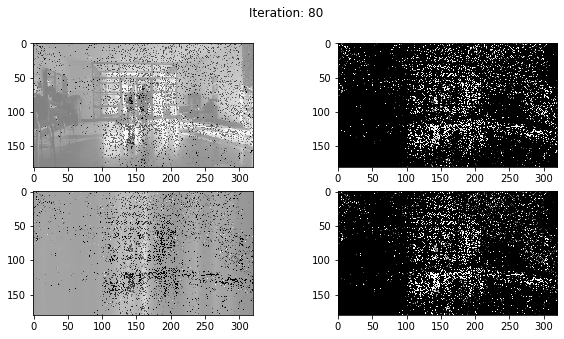

Image L rank:  50
Radar L rank:  50
Time:  0.08621549606323242
Iteration:  81
Image L rank:  50
Radar L rank:  50
Time:  0.08140826225280762
Iteration:  82
Image L rank:  50
Radar L rank:  50
Time:  0.0802454948425293
Iteration:  83
Image L rank:  50
Radar L rank:  50
Time:  0.08305716514587402
Iteration:  84
Image L rank:  50
Radar L rank:  50
Time:  0.10028386116027832
Iteration:  85
Image L rank:  50
Radar L rank:  50
Time:  0.08258557319641113
Iteration:  86
Image L rank:  50
Radar L rank:  50
Time:  0.08133506774902344
Iteration:  87
Image L rank:  50
Radar L rank:  50
Time:  0.08192014694213867
Iteration:  88
Image L rank:  50
Radar L rank:  50
Time:  0.08140015602111816
Iteration:  89
Image L rank:  50
Radar L rank:  50
Time:  0.08101153373718262
Iteration:  90


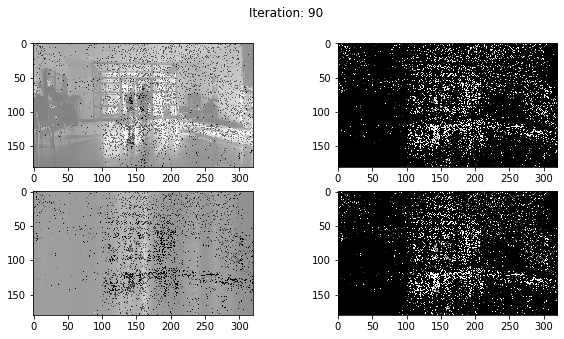

Image L rank:  50
Radar L rank:  50
Time:  0.0964667797088623
Iteration:  91
Image L rank:  50
Radar L rank:  50
Time:  0.08051705360412598
Iteration:  92
Image L rank:  50
Radar L rank:  50
Time:  0.08189535140991211
Iteration:  93
Image L rank:  50
Radar L rank:  50
Time:  0.07914233207702637
Iteration:  94
Image L rank:  50
Radar L rank:  50
Time:  0.0865793228149414
Iteration:  95
Image L rank:  50
Radar L rank:  50
Time:  0.08420276641845703
Iteration:  96
Image L rank:  50
Radar L rank:  50
Time:  0.08795475959777832
Iteration:  97
Image L rank:  50
Radar L rank:  50
Time:  0.08629584312438965
Iteration:  98
Image L rank:  50
Radar L rank:  50
Time:  0.08810663223266602
Iteration:  99
Image L rank:  50
Radar L rank:  50
Time:  0.08639883995056152
Iteration:  100


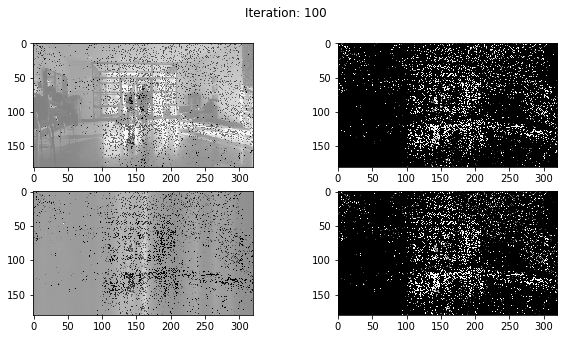

Image L rank:  50
Radar L rank:  50
Time:  0.08576107025146484
Iteration:  101
Image L rank:  50
Radar L rank:  50
Time:  0.08655810356140137
Iteration:  102
Image L rank:  50
Radar L rank:  50
Time:  0.10739731788635254
Iteration:  103
Image L rank:  50
Radar L rank:  50
Time:  0.08848190307617188
Iteration:  104
Image L rank:  50
Radar L rank:  50
Time:  0.08658456802368164
Iteration:  105
Image L rank:  50
Radar L rank:  50
Time:  0.08578658103942871
Iteration:  106
Image L rank:  50
Radar L rank:  50
Time:  0.08713674545288086
Iteration:  107
Image L rank:  50
Radar L rank:  50
Time:  0.08726096153259277
Iteration:  108
Image L rank:  50
Radar L rank:  50
Time:  0.08701467514038086
Iteration:  109
Image L rank:  50
Radar L rank:  50
Time:  0.08752775192260742
Iteration:  110


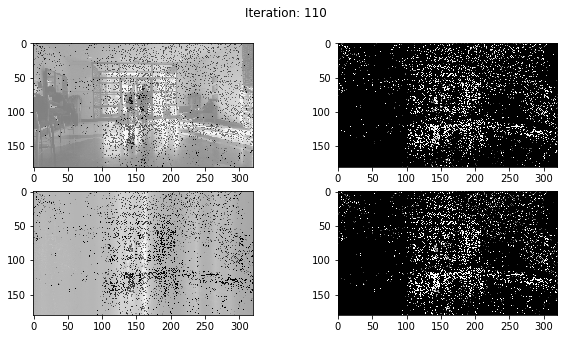

Image L rank:  50
Radar L rank:  50
Time:  0.08651471138000488
Iteration:  111
Image L rank:  50
Radar L rank:  50
Time:  0.08592057228088379
Iteration:  112
Image L rank:  50
Radar L rank:  50
Time:  0.08822917938232422
Iteration:  113
Image L rank:  50
Radar L rank:  50
Time:  0.08702850341796875
Iteration:  114
Image L rank:  50
Radar L rank:  50
Time:  0.08870100975036621
Iteration:  115
Image L rank:  50
Radar L rank:  50
Time:  0.08630895614624023
Iteration:  116
Image L rank:  50
Radar L rank:  50
Time:  0.1094820499420166
Iteration:  117
Image L rank:  50
Radar L rank:  50
Time:  0.08489322662353516
Iteration:  118
Image L rank:  50
Radar L rank:  50
Time:  0.1201179027557373
Iteration:  119
Image L rank:  50
Radar L rank:  50
Time:  0.11557459831237793
Iteration:  120


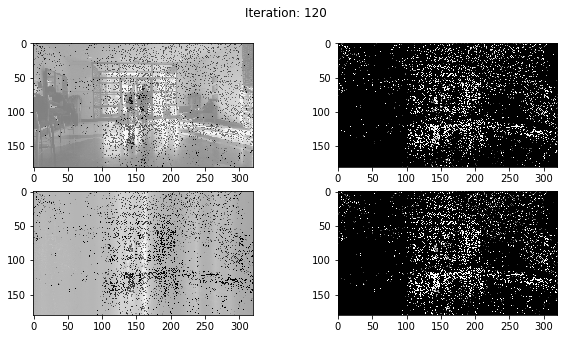

Image L rank:  50
Radar L rank:  50
Time:  0.11801362037658691
Iteration:  121
Image L rank:  50
Radar L rank:  50
Time:  0.11891484260559082
Iteration:  122
Image L rank:  50
Radar L rank:  50
Time:  0.11597847938537598
Iteration:  123
Image L rank:  50


KeyboardInterrupt: 

In [5]:
image_L, image_S, radar_L, radar_S, (u, s, v), errors, ranks, nnzs = joint_prod_ista(D, M_F, verbose=True, maxiter=500,
                                          plot_num=10,im_shape=[720//4,1280//4]) ##############

mu = 0.6306509783844475
Image L rank:  50
Radar L rank:  40
Time:  0.07500982284545898
Iteration:  0


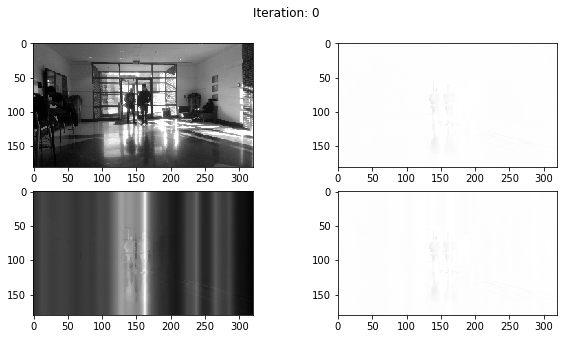

Image L rank:  32
Radar L rank:  29
Time:  0.145033597946167
Iteration:  1
Image L rank:  26
Radar L rank:  26
Time:  0.12477612495422363
Iteration:  2
Image L rank:  25
Radar L rank:  23
Time:  0.1362309455871582
Iteration:  3
Image L rank:  22
Radar L rank:  21
Time:  0.10149502754211426
Iteration:  4
Image L rank:  21
Radar L rank:  20
Time:  0.10015702247619629
Iteration:  5
Image L rank:  19
Radar L rank:  19
Time:  0.09178686141967773
Iteration:  6
Image L rank:  17
Radar L rank:  17
Time:  0.08662056922912598
Iteration:  7
Image L rank:  16
Radar L rank:  14
Time:  0.08217382431030273
Iteration:  8
Image L rank:  13
Radar L rank:  12
Time:  0.06800150871276855
Iteration:  9
Image L rank:  12
Radar L rank:  11
Time:  0.058379411697387695
Iteration:  10


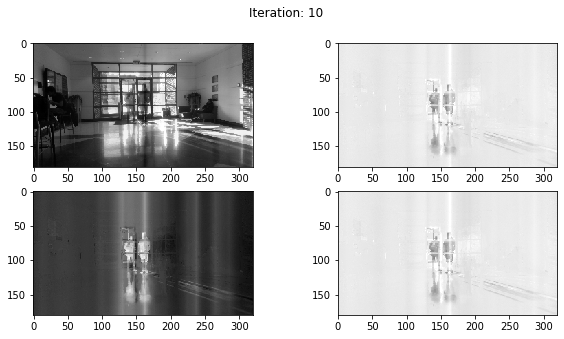

Image L rank:  10
Radar L rank:  10
Time:  0.04389524459838867
Iteration:  11
Image L rank:  10
Radar L rank:  10
Time:  0.056337833404541016
Iteration:  12
Image L rank:  9
Radar L rank:  9
Time:  0.04331183433532715
Iteration:  13
Image L rank:  8
Radar L rank:  7
Time:  0.04123234748840332
Iteration:  14
Image L rank:  7
Radar L rank:  7
Time:  0.0395197868347168
Iteration:  15
Image L rank:  6
Radar L rank:  6
Time:  0.043306827545166016
Iteration:  16
Image L rank:  6
Radar L rank:  5
Time:  0.036026716232299805
Iteration:  17
Image L rank:  5
Radar L rank:  5
Time:  0.03316926956176758
Iteration:  18
Image L rank:  5
Radar L rank:  4
Time:  0.03573751449584961
Iteration:  19
Image L rank:  4
Radar L rank:  4
Time:  0.0338747501373291
Iteration:  20


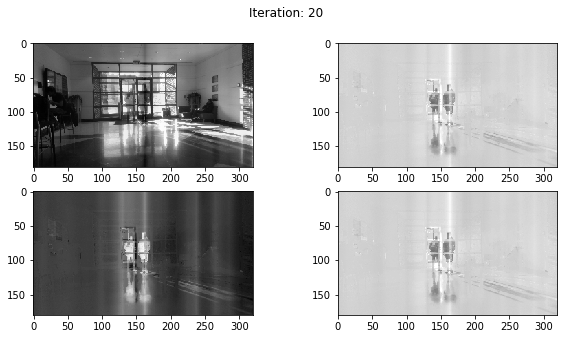

Image L rank:  4
Radar L rank:  4
Time:  0.042296648025512695
Iteration:  21
Image L rank:  3
Radar L rank:  3
Time:  0.03847980499267578
Iteration:  22
Image L rank:  3
Radar L rank:  3
Time:  0.030974388122558594
Iteration:  23
Image L rank:  3
Radar L rank:  3
Time:  0.031641244888305664
Iteration:  24
Image L rank:  3
Radar L rank:  3
Time:  0.03393435478210449
Iteration:  25
Image L rank:  3
Radar L rank:  2
Time:  0.03113389015197754
Iteration:  26
Image L rank:  2
Radar L rank:  2
Time:  0.029404401779174805
Iteration:  27
Image L rank:  2
Radar L rank:  2
Time:  0.03190112113952637
Iteration:  28
Image L rank:  2
Radar L rank:  2
Time:  0.02972865104675293
Iteration:  29
Image L rank:  1
Radar L rank:  1
Time:  0.02688121795654297
Iteration:  30


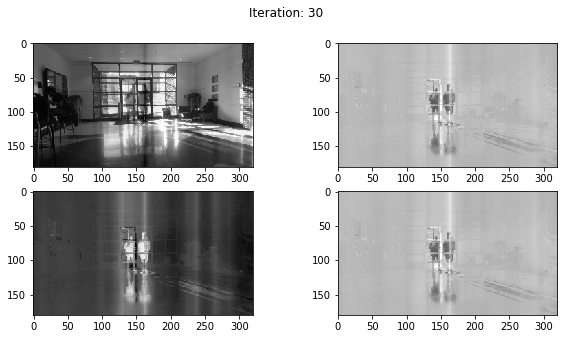

Image L rank:  1
Radar L rank:  1
Time:  0.02687811851501465
Iteration:  31
Image L rank:  1
Radar L rank:  1
Time:  0.026929855346679688
Iteration:  32
Image L rank:  1
Radar L rank:  1
Time:  0.026562213897705078
Iteration:  33
Image L rank:  1
Radar L rank:  1
Time:  0.028393030166625977
Iteration:  34
Image L rank:  1
Radar L rank:  1
Time:  0.026773452758789062
Iteration:  35
Image L rank:  1
Radar L rank:  1
Time:  0.027131319046020508
Iteration:  36
Image L rank:  1
Radar L rank:  1
Time:  0.029033660888671875
Iteration:  37
Image L rank:  1
Radar L rank:  1
Time:  0.027063608169555664
Iteration:  38
Image L rank:  1
Radar L rank:  1
Time:  0.028904438018798828
Iteration:  39
Image L rank:  1
Radar L rank:  1
Time:  0.03652477264404297
Iteration:  40


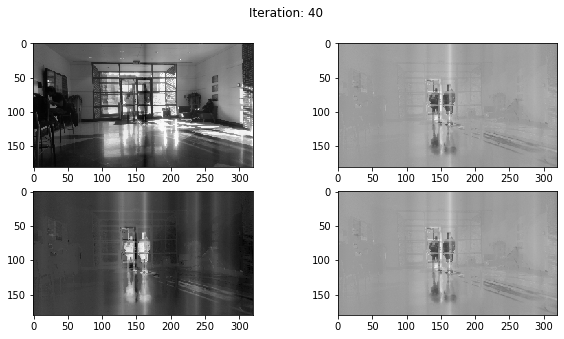

Image L rank:  1
Radar L rank:  1
Time:  0.02789759635925293
Iteration:  41
Image L rank:  1
Radar L rank:  1
Time:  0.026638269424438477
Iteration:  42
Image L rank:  1
Radar L rank:  1
Time:  0.02992868423461914
Iteration:  43
Image L rank:  1
Radar L rank:  1
Time:  0.028741121292114258
Iteration:  44
Image L rank:  1
Radar L rank:  1
Time:  0.027489423751831055
Iteration:  45
Image L rank:  1
Radar L rank:  1
Time:  0.027095556259155273
Iteration:  46
Image L rank:  1
Radar L rank:  1
Time:  0.03539681434631348
Iteration:  47
Image L rank:  1
Radar L rank:  1
Time:  0.028505802154541016
Iteration:  48
Image L rank:  1
Radar L rank:  1
Time:  0.028099536895751953
Iteration:  49
Image L rank:  1
Radar L rank:  2
Time:  0.03142905235290527
Iteration:  50


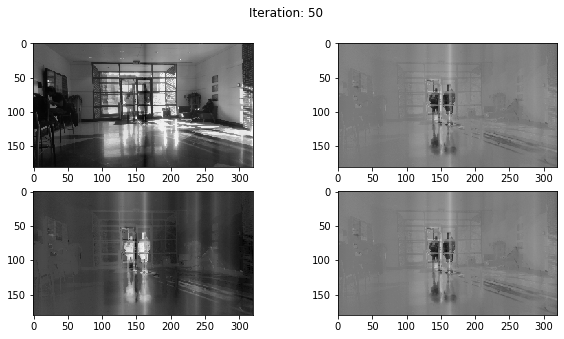

Image L rank:  2
Radar L rank:  2
Time:  0.029297351837158203
Iteration:  51
Image L rank:  2
Radar L rank:  3
Time:  0.0310671329498291
Iteration:  52
Image L rank:  3
Radar L rank:  3
Time:  0.03309154510498047
Iteration:  53
Image L rank:  4
Radar L rank:  5
Time:  0.037146806716918945
Iteration:  54
Image L rank:  5
Radar L rank:  5
Time:  0.04529452323913574
Iteration:  55
Image L rank:  5
Radar L rank:  5
Time:  0.04035019874572754
Iteration:  56
Image L rank:  5
Radar L rank:  6
Time:  0.03893780708312988
Iteration:  57
Image L rank:  6
Radar L rank:  6
Time:  0.04532217979431152
Iteration:  58
Image L rank:  6
Radar L rank:  7
Time:  0.03728365898132324
Iteration:  59
Image L rank:  7
Radar L rank:  8
Time:  0.0421910285949707
Iteration:  60


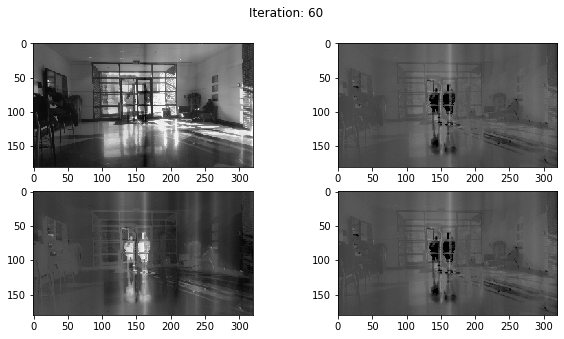

Image L rank:  8
Radar L rank:  9
Time:  0.0538632869720459
Iteration:  61
Image L rank:  10
Radar L rank:  11
Time:  0.047263383865356445
Iteration:  62
Image L rank:  12
Radar L rank:  13
Time:  0.07071256637573242
Iteration:  63
Image L rank:  14
Radar L rank:  15
Time:  0.06672000885009766
Iteration:  64
Image L rank:  16
Radar L rank:  17
Time:  0.07560944557189941
Iteration:  65
Image L rank:  18
Radar L rank:  19
Time:  0.08404350280761719
Iteration:  66
Image L rank:  20
Radar L rank:  21
Time:  0.09342765808105469
Iteration:  67
Image L rank:  22
Radar L rank:  23
Time:  0.10977888107299805
Iteration:  68
Image L rank:  24
Radar L rank:  25
Time:  0.1462392807006836
Iteration:  69
Image L rank:  26
Radar L rank:  27
Time:  0.12864184379577637
Iteration:  70


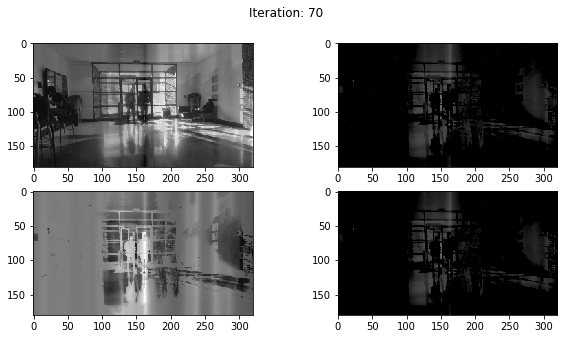

Image L rank:  28
Radar L rank:  29
Time:  0.1282057762145996
Iteration:  71
Image L rank:  30
Radar L rank:  31
Time:  0.12321019172668457
Iteration:  72
Image L rank:  32
Radar L rank:  33
Time:  0.13038873672485352
Iteration:  73
Image L rank:  34
Radar L rank:  35
Time:  0.16361427307128906
Iteration:  74
Image L rank:  36
Radar L rank:  35
Time:  0.14394712448120117
Iteration:  75
Image L rank:  36
Radar L rank:  35
Time:  0.14901137351989746
Iteration:  76
Image L rank:  36
Radar L rank:  35
Time:  0.14777159690856934
Iteration:  77
Image L rank:  36
Radar L rank:  36
Time:  0.14876794815063477
Iteration:  78
Image L rank:  37
Radar L rank:  36
Time:  0.07845306396484375
Iteration:  79
Image L rank:  36
Radar L rank:  35
Time:  0.15975022315979004
Iteration:  80


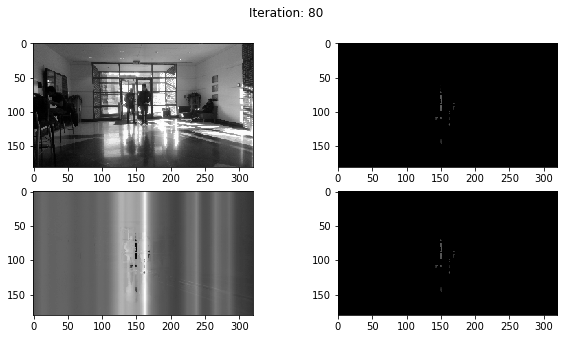

Image L rank:  36
Radar L rank:  35
Time:  0.1850271224975586
Iteration:  81
Image L rank:  35
Radar L rank:  35
Time:  0.14269280433654785
Iteration:  82
Image L rank:  35
Radar L rank:  35
Time:  0.14252662658691406
Iteration:  83
Image L rank:  35
Radar L rank:  35
Time:  0.2064516544342041
Iteration:  84
Image L rank:  35
Radar L rank:  35
Time:  0.14697837829589844
Iteration:  85
Image L rank:  35
Radar L rank:  34
Time:  0.1645362377166748
Iteration:  86
Image L rank:  34
Radar L rank:  35
Time:  0.14070463180541992
Iteration:  87
Image L rank:  35
Radar L rank:  35
Time:  0.15420770645141602
Iteration:  88
Image L rank:  35
Radar L rank:  35
Time:  0.15329575538635254
Iteration:  89
Image L rank:  35
Radar L rank:  34
Time:  0.17507147789001465
Iteration:  90


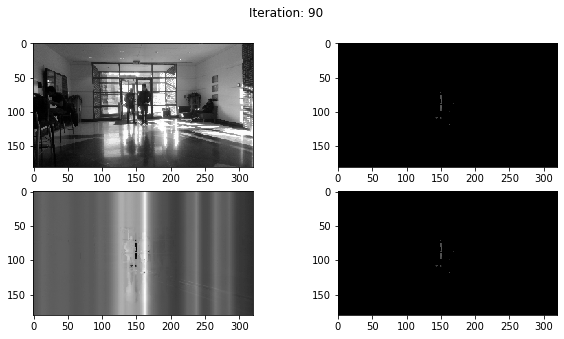

Image L rank:  35
Radar L rank:  35
Time:  0.32898616790771484
Iteration:  91
Image L rank:  35
Radar L rank:  35
Time:  1.9240481853485107
Iteration:  92
Image L rank:  35
Radar L rank:  35
Time:  1.1157655715942383
Iteration:  93
Image L rank:  35
Radar L rank:  35
Time:  0.9964990615844727
Iteration:  94
Image L rank:  35
Radar L rank:  35
Time:  0.9007413387298584
Iteration:  95
Image L rank:  35
Radar L rank:  34
Time:  0.8994858264923096
Iteration:  96
Image L rank:  34
Radar L rank:  35
Time:  0.8540375232696533
Iteration:  97
Image L rank:  35
Radar L rank:  34
Time:  0.8806025981903076
Iteration:  98
Image L rank:  35
Radar L rank:  34
Time:  0.13445043563842773
Iteration:  99
Image L rank:  34
Radar L rank:  34
Time:  0.1437699794769287
Iteration:  100


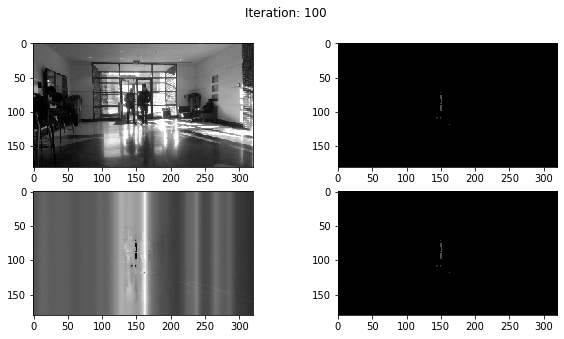

Image L rank:  34
Radar L rank:  35
Time:  0.14194822311401367
Iteration:  101
Image L rank:  35
Radar L rank:  35
Time:  0.13654136657714844
Iteration:  102
Image L rank:  34
Radar L rank:  34
Time:  0.13466286659240723
Iteration:  103
Image L rank:  35
Radar L rank:  34
Time:  0.14711236953735352
Iteration:  104
Image L rank:  35
Radar L rank:  35
Time:  0.20027494430541992
Iteration:  105
Image L rank:  35
Radar L rank:  34
Time:  0.16832637786865234
Iteration:  106
Image L rank:  34
Radar L rank:  33
Time:  0.17156028747558594
Iteration:  107
Image L rank:  34
Radar L rank:  34
Time:  0.17350125312805176
Iteration:  108
Image L rank:  34
Radar L rank:  35
Time:  0.16739320755004883
Iteration:  109
Image L rank:  35
Radar L rank:  35
Time:  0.15922880172729492
Iteration:  110


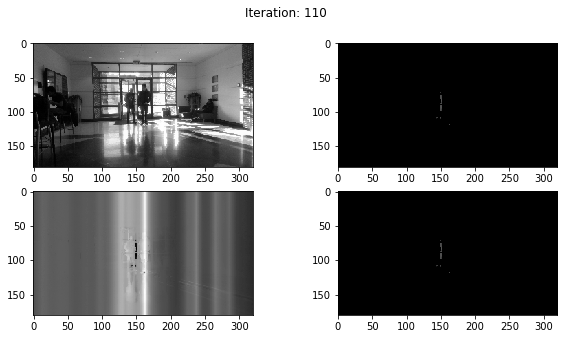

Image L rank:  34
Radar L rank:  35
Time:  0.14558649063110352
Iteration:  111
Image L rank:  35
Radar L rank:  34
Time:  0.15212678909301758
Iteration:  112
Image L rank:  35
Radar L rank:  34
Time:  0.15219759941101074
Iteration:  113
Image L rank:  35
Radar L rank:  35
Time:  0.15691542625427246
Iteration:  114
Image L rank:  35
Radar L rank:  35
Time:  0.1344926357269287
Iteration:  115
Image L rank:  35
Radar L rank:  35
Time:  0.1554253101348877
Iteration:  116
Image L rank:  35
Radar L rank:  35
Time:  0.15224409103393555
Iteration:  117
Image L rank:  35
Radar L rank:  35
Time:  0.15688180923461914
Iteration:  118
Image L rank:  35
Radar L rank:  35
Time:  0.15334057807922363
Iteration:  119
Image L rank:  34
Radar L rank:  34
Time:  0.15265536308288574
Iteration:  120


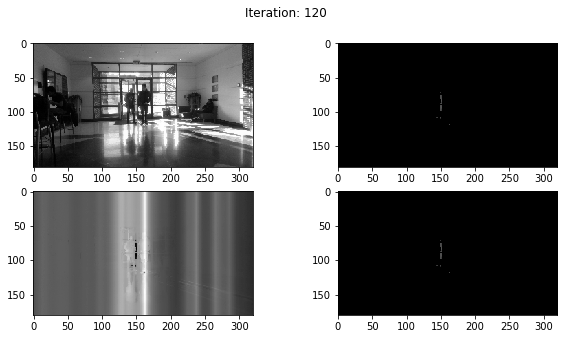

Image L rank:  35
Radar L rank:  35
Time:  0.15108537673950195
Iteration:  121
Image L rank:  35
Radar L rank:  35
Time:  0.17343807220458984
Iteration:  122
Image L rank:  35
Radar L rank:  35
Time:  0.17886805534362793
Iteration:  123
Image L rank:  35
Radar L rank:  35
Time:  0.16282987594604492
Iteration:  124


KeyboardInterrupt: 

In [4]:
image_L, image_S, radar_L, radar_S, (u, s, v), errors, ranks, nnzs = joint_mix_ista(D, M_F, verbose=True, maxiter=500,
                                          plot_num=10,im_shape=[720//4,1280//4]) ##############

mu = 1.0041699745421542
Iteration 0: error=9.082e-03, rank=34, nnz=333540, time=7.302e-02


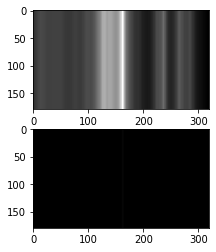

Iteration 1: error=9.317e-03, rank=31, nnz=379980, time=1.199e-01
Iteration 2: error=9.511e-03, rank=31, nnz=411300, time=1.007e-01
Iteration 3: error=9.683e-03, rank=30, nnz=442980, time=1.032e-01
Iteration 4: error=9.809e-03, rank=28, nnz=466920, time=9.950e-02
Iteration 5: error=9.915e-03, rank=27, nnz=488160, time=1.139e-01
Iteration 6: error=9.992e-03, rank=26, nnz=503640, time=1.043e-01
Iteration 7: error=1.007e-02, rank=26, nnz=519840, time=1.021e-01
Iteration 8: error=1.015e-02, rank=26, nnz=535320, time=9.748e-02
Iteration 9: error=1.022e-02, rank=26, nnz=545040, time=1.024e-01
Iteration 10: error=1.029e-02, rank=25, nnz=554220, time=9.723e-02


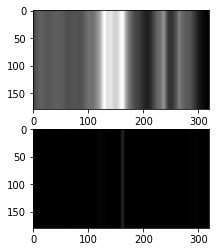

Iteration 11: error=1.035e-02, rank=25, nnz=565740, time=1.021e-01
Iteration 12: error=1.040e-02, rank=23, nnz=574920, time=9.216e-02
Iteration 13: error=1.044e-02, rank=23, nnz=582840, time=9.134e-02
Iteration 14: error=1.048e-02, rank=23, nnz=591660, time=8.273e-02
Iteration 15: error=1.051e-02, rank=23, nnz=599040, time=9.198e-02
Iteration 16: error=1.055e-02, rank=23, nnz=605700, time=8.287e-02
Iteration 17: error=1.058e-02, rank=23, nnz=611100, time=9.988e-02
Iteration 18: error=1.061e-02, rank=23, nnz=615060, time=8.871e-02
Iteration 19: error=1.063e-02, rank=23, nnz=619020, time=9.121e-02
Iteration 20: error=1.065e-02, rank=23, nnz=622800, time=8.325e-02


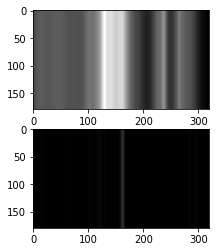

Iteration 21: error=1.068e-02, rank=23, nnz=627120, time=9.137e-02
Iteration 22: error=1.070e-02, rank=23, nnz=633060, time=8.242e-02
Iteration 23: error=1.072e-02, rank=23, nnz=635580, time=9.086e-02
Iteration 24: error=1.074e-02, rank=22, nnz=639720, time=8.400e-02
Iteration 25: error=1.075e-02, rank=22, nnz=642060, time=8.589e-02
Iteration 26: error=1.077e-02, rank=22, nnz=647460, time=7.923e-02
Iteration 27: error=1.079e-02, rank=22, nnz=651240, time=8.458e-02
Iteration 28: error=1.080e-02, rank=22, nnz=655920, time=7.886e-02
Iteration 29: error=1.081e-02, rank=21, nnz=659880, time=8.872e-02
Iteration 30: error=1.083e-02, rank=21, nnz=661860, time=7.596e-02


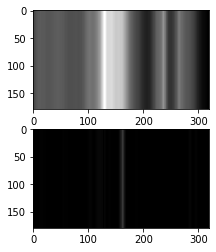

Iteration 31: error=1.085e-02, rank=21, nnz=665820, time=8.554e-02
Iteration 32: error=1.086e-02, rank=21, nnz=667620, time=7.644e-02
Iteration 33: error=1.086e-02, rank=21, nnz=671400, time=8.293e-02
Iteration 34: error=1.087e-02, rank=21, nnz=673380, time=7.602e-02
Iteration 35: error=1.089e-02, rank=21, nnz=677880, time=8.138e-02
Iteration 36: error=1.090e-02, rank=21, nnz=678780, time=7.571e-02
Iteration 37: error=1.090e-02, rank=21, nnz=680040, time=8.387e-02
Iteration 38: error=1.092e-02, rank=21, nnz=680400, time=7.598e-02
Iteration 39: error=1.094e-02, rank=21, nnz=684540, time=8.248e-02
Iteration 40: error=1.094e-02, rank=21, nnz=684900, time=7.591e-02


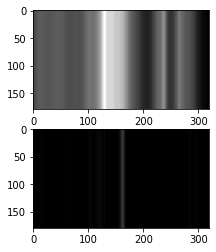

Iteration 41: error=1.095e-02, rank=21, nnz=686340, time=7.843e-02
Iteration 42: error=1.095e-02, rank=21, nnz=687960, time=7.583e-02
Iteration 43: error=1.097e-02, rank=21, nnz=691920, time=8.322e-02
Iteration 44: error=1.098e-02, rank=21, nnz=693540, time=7.481e-02
Iteration 45: error=1.098e-02, rank=21, nnz=693900, time=7.844e-02
Iteration 46: error=1.098e-02, rank=21, nnz=695160, time=8.272e-02
Iteration 47: error=1.099e-02, rank=21, nnz=696060, time=8.494e-02
Iteration 48: error=1.101e-02, rank=20, nnz=698580, time=7.535e-02
Iteration 49: error=1.102e-02, rank=20, nnz=699480, time=7.463e-02
Iteration 50: error=1.102e-02, rank=21, nnz=698760, time=8.946e-02


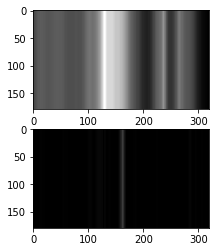

Iteration 51: error=1.102e-02, rank=21, nnz=699300, time=7.824e-02
Iteration 52: error=1.103e-02, rank=21, nnz=700200, time=9.811e-02
Iteration 53: error=1.103e-02, rank=21, nnz=702360, time=9.752e-02
Iteration 54: error=1.104e-02, rank=21, nnz=702360, time=7.597e-02
Iteration 55: error=1.104e-02, rank=21, nnz=705600, time=9.470e-02
Iteration 56: error=1.105e-02, rank=21, nnz=707580, time=9.230e-02
Iteration 57: error=1.106e-02, rank=21, nnz=709020, time=7.918e-02
Iteration 58: error=1.107e-02, rank=21, nnz=709740, time=7.693e-02
Iteration 59: error=1.108e-02, rank=21, nnz=709740, time=9.317e-02
Iteration 60: error=1.109e-02, rank=20, nnz=712800, time=7.646e-02


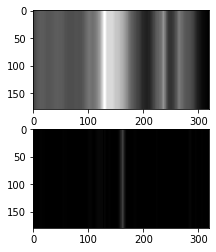

Iteration 61: error=1.109e-02, rank=21, nnz=713880, time=7.438e-02
Iteration 62: error=1.109e-02, rank=21, nnz=714600, time=8.856e-02
Iteration 63: error=1.109e-02, rank=21, nnz=715680, time=8.028e-02
Iteration 64: error=1.109e-02, rank=21, nnz=716400, time=1.023e-01
Iteration 65: error=1.110e-02, rank=21, nnz=718560, time=8.116e-02
Iteration 66: error=1.111e-02, rank=21, nnz=718020, time=7.615e-02
Iteration 67: error=1.111e-02, rank=21, nnz=719100, time=7.949e-02
Iteration 68: error=1.111e-02, rank=21, nnz=720540, time=7.607e-02
Iteration 69: error=1.112e-02, rank=21, nnz=722880, time=9.221e-02
Iteration 70: error=1.112e-02, rank=20, nnz=723240, time=8.042e-02


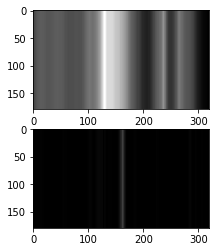

Iteration 71: error=1.113e-02, rank=20, nnz=725760, time=7.901e-02
Iteration 72: error=1.113e-02, rank=20, nnz=727200, time=7.526e-02
Iteration 73: error=1.113e-02, rank=20, nnz=726840, time=7.669e-02
Iteration 74: error=1.113e-02, rank=20, nnz=728280, time=7.403e-02
Iteration 75: error=1.114e-02, rank=20, nnz=730080, time=7.573e-02
Iteration 76: error=1.114e-02, rank=20, nnz=729720, time=7.136e-02
Iteration 77: error=1.115e-02, rank=20, nnz=728640, time=7.416e-02
Iteration 78: error=1.115e-02, rank=20, nnz=729900, time=7.293e-02
Iteration 79: error=1.115e-02, rank=20, nnz=730440, time=7.607e-02
Iteration 80: error=1.116e-02, rank=19, nnz=732240, time=7.316e-02


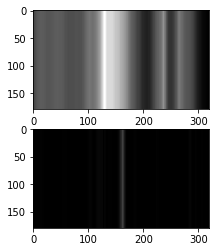

Iteration 81: error=1.116e-02, rank=20, nnz=733860, time=9.627e-02
Iteration 82: error=1.116e-02, rank=20, nnz=733500, time=7.346e-02
Iteration 83: error=1.116e-02, rank=20, nnz=733680, time=1.011e-01
Iteration 84: error=1.116e-02, rank=20, nnz=733320, time=7.473e-02
Iteration 85: error=1.116e-02, rank=19, nnz=734220, time=7.831e-02
Iteration 86: error=1.116e-02, rank=20, nnz=734220, time=7.514e-02
Iteration 87: error=1.118e-02, rank=19, nnz=735660, time=8.087e-02
Iteration 88: error=1.118e-02, rank=19, nnz=736560, time=6.920e-02
Iteration 89: error=1.118e-02, rank=19, nnz=735660, time=7.317e-02
Iteration 90: error=1.118e-02, rank=19, nnz=736920, time=6.983e-02


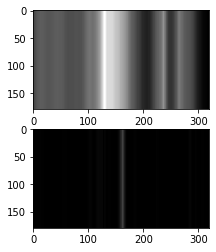

Iteration 91: error=1.118e-02, rank=19, nnz=739080, time=8.716e-02
Iteration 92: error=1.119e-02, rank=19, nnz=737640, time=6.888e-02
Iteration 93: error=1.119e-02, rank=19, nnz=738540, time=7.078e-02
Iteration 94: error=1.119e-02, rank=20, nnz=737640, time=7.278e-02
Iteration 95: error=1.119e-02, rank=19, nnz=739440, time=7.636e-02
Iteration 96: error=1.119e-02, rank=19, nnz=739260, time=6.858e-02
Iteration 97: error=1.120e-02, rank=19, nnz=741600, time=7.097e-02
Iteration 98: error=1.119e-02, rank=20, nnz=738540, time=6.850e-02
Iteration 99: error=1.119e-02, rank=19, nnz=739980, time=7.393e-02
Iteration 100: error=1.119e-02, rank=19, nnz=738900, time=7.845e-02


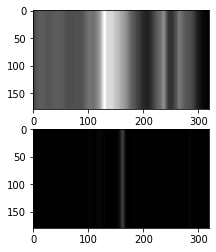

Iteration 101: error=1.120e-02, rank=19, nnz=741780, time=7.470e-02
Iteration 102: error=1.119e-02, rank=19, nnz=740160, time=6.652e-02
Iteration 103: error=1.120e-02, rank=19, nnz=740880, time=6.714e-02
Iteration 104: error=1.121e-02, rank=19, nnz=741960, time=6.729e-02
Iteration 105: error=1.121e-02, rank=19, nnz=741420, time=6.777e-02
Iteration 106: error=1.121e-02, rank=20, nnz=741420, time=6.705e-02
Iteration 107: error=1.120e-02, rank=19, nnz=739980, time=7.125e-02
Iteration 108: error=1.121e-02, rank=19, nnz=741780, time=8.679e-02
Iteration 109: error=1.121e-02, rank=19, nnz=741780, time=7.420e-02
Iteration 110: error=1.121e-02, rank=19, nnz=740340, time=6.930e-02


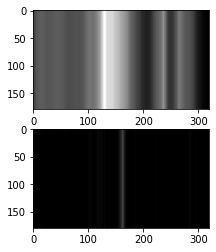

Iteration 111: error=1.121e-02, rank=19, nnz=740700, time=7.265e-02
Iteration 112: error=1.120e-02, rank=19, nnz=740520, time=6.796e-02
Iteration 113: error=1.121e-02, rank=19, nnz=740880, time=7.027e-02
Iteration 114: error=1.121e-02, rank=19, nnz=740700, time=9.925e-02
Iteration 115: error=1.121e-02, rank=19, nnz=741420, time=7.451e-02
Iteration 116: error=1.121e-02, rank=19, nnz=740880, time=6.894e-02
Iteration 117: error=1.121e-02, rank=19, nnz=740700, time=6.688e-02
Iteration 118: error=1.121e-02, rank=19, nnz=739440, time=6.830e-02
Iteration 119: error=1.121e-02, rank=19, nnz=739980, time=8.581e-02
Iteration 120: error=1.121e-02, rank=19, nnz=740340, time=7.130e-02


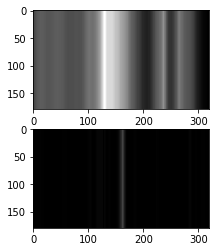

Iteration 121: error=1.121e-02, rank=19, nnz=738900, time=6.962e-02
Iteration 122: error=1.121e-02, rank=19, nnz=739440, time=7.618e-02
Iteration 123: error=1.122e-02, rank=19, nnz=742500, time=7.681e-02
Iteration 124: error=1.122e-02, rank=19, nnz=742860, time=6.831e-02
Iteration 125: error=1.122e-02, rank=19, nnz=741780, time=6.668e-02
Iteration 126: error=1.122e-02, rank=19, nnz=742500, time=8.318e-02
Iteration 127: error=1.122e-02, rank=19, nnz=742140, time=7.419e-02
Iteration 128: error=1.122e-02, rank=19, nnz=741420, time=6.669e-02
Iteration 129: error=1.122e-02, rank=19, nnz=740700, time=6.818e-02
Iteration 130: error=1.122e-02, rank=19, nnz=742860, time=7.403e-02


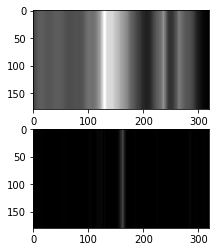

Iteration 131: error=1.122e-02, rank=19, nnz=742860, time=7.082e-02
Iteration 132: error=1.123e-02, rank=19, nnz=743220, time=7.936e-02
Iteration 133: error=1.122e-02, rank=19, nnz=744840, time=7.028e-02
Iteration 134: error=1.123e-02, rank=19, nnz=744840, time=6.703e-02
Iteration 135: error=1.124e-02, rank=19, nnz=746280, time=6.708e-02
Iteration 136: error=1.123e-02, rank=19, nnz=745200, time=8.240e-02
Iteration 137: error=1.124e-02, rank=19, nnz=745920, time=9.018e-02
Iteration 138: error=1.126e-02, rank=18, nnz=749700, time=7.348e-02
Iteration 139: error=1.124e-02, rank=19, nnz=748800, time=6.323e-02
Iteration 140: error=1.124e-02, rank=19, nnz=747720, time=6.700e-02


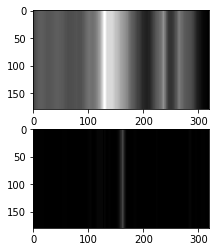

Iteration 141: error=1.124e-02, rank=19, nnz=747000, time=9.961e-02
Iteration 142: error=1.125e-02, rank=19, nnz=748980, time=7.237e-02
Iteration 143: error=1.125e-02, rank=19, nnz=748440, time=7.119e-02
Iteration 144: error=1.125e-02, rank=19, nnz=748440, time=6.882e-02
Iteration 145: error=1.124e-02, rank=19, nnz=747540, time=6.850e-02
Iteration 146: error=1.123e-02, rank=19, nnz=747180, time=6.806e-02
Iteration 147: error=1.124e-02, rank=19, nnz=747540, time=6.730e-02
Iteration 148: error=1.124e-02, rank=19, nnz=747000, time=7.153e-02
Iteration 149: error=1.125e-02, rank=19, nnz=749520, time=6.966e-02
Iteration 150: error=1.124e-02, rank=19, nnz=748260, time=6.785e-02


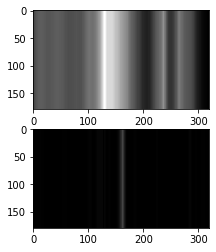

Iteration 151: error=1.124e-02, rank=19, nnz=748080, time=1.000e-01
Iteration 152: error=1.124e-02, rank=19, nnz=748260, time=7.434e-02
Iteration 153: error=1.123e-02, rank=19, nnz=748080, time=6.846e-02
Iteration 154: error=1.123e-02, rank=19, nnz=747180, time=6.780e-02
Iteration 155: error=1.123e-02, rank=19, nnz=747540, time=9.119e-02
Iteration 156: error=1.124e-02, rank=19, nnz=747720, time=7.238e-02
Iteration 157: error=1.124e-02, rank=19, nnz=747540, time=6.877e-02
Iteration 158: error=1.125e-02, rank=19, nnz=748260, time=6.942e-02
Iteration 159: error=1.124e-02, rank=19, nnz=747180, time=7.284e-02
Iteration 160: error=1.124e-02, rank=19, nnz=747180, time=6.910e-02


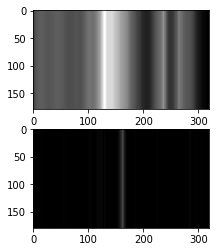

Iteration 161: error=1.124e-02, rank=19, nnz=747180, time=7.442e-02
Iteration 162: error=1.124e-02, rank=19, nnz=747360, time=6.699e-02
Iteration 163: error=1.124e-02, rank=19, nnz=746100, time=7.027e-02
Iteration 164: error=1.125e-02, rank=19, nnz=747720, time=7.607e-02
Iteration 165: error=1.124e-02, rank=19, nnz=747540, time=7.315e-02
Iteration 166: error=1.125e-02, rank=19, nnz=748260, time=7.139e-02
Iteration 167: error=1.126e-02, rank=18, nnz=747900, time=9.291e-02
Iteration 168: error=1.125e-02, rank=19, nnz=749700, time=8.152e-02
Iteration 169: error=1.125e-02, rank=19, nnz=748080, time=7.304e-02
Iteration 170: error=1.124e-02, rank=19, nnz=748260, time=7.072e-02


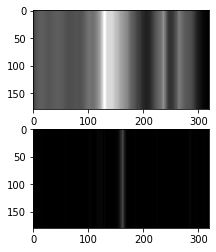

Iteration 171: error=1.125e-02, rank=19, nnz=746640, time=7.548e-02
Iteration 172: error=1.124e-02, rank=19, nnz=747180, time=6.895e-02
Iteration 173: error=1.124e-02, rank=19, nnz=747360, time=9.267e-02
Iteration 174: error=1.125e-02, rank=19, nnz=748080, time=7.377e-02
Iteration 175: error=1.125e-02, rank=19, nnz=748080, time=6.988e-02
Iteration 176: error=1.125e-02, rank=19, nnz=747720, time=6.754e-02
Iteration 177: error=1.125e-02, rank=19, nnz=748800, time=8.740e-02
Iteration 178: error=1.125e-02, rank=19, nnz=749340, time=8.032e-02
Iteration 179: error=1.125e-02, rank=19, nnz=749340, time=7.177e-02
Iteration 180: error=1.125e-02, rank=19, nnz=750060, time=7.402e-02


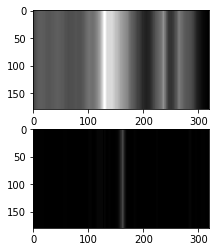

Iteration 181: error=1.125e-02, rank=19, nnz=749520, time=7.015e-02
Iteration 182: error=1.125e-02, rank=19, nnz=748620, time=6.981e-02
Iteration 183: error=1.125e-02, rank=19, nnz=748260, time=7.115e-02
Iteration 184: error=1.125e-02, rank=19, nnz=749520, time=9.084e-02
Iteration 185: error=1.126e-02, rank=18, nnz=750600, time=1.082e-01
Iteration 186: error=1.126e-02, rank=19, nnz=752580, time=8.144e-02
Iteration 187: error=1.126e-02, rank=19, nnz=751860, time=9.311e-02
Iteration 188: error=1.126e-02, rank=19, nnz=750240, time=1.058e-01
Iteration 189: error=1.126e-02, rank=19, nnz=748980, time=9.909e-02
Iteration 190: error=1.126e-02, rank=19, nnz=750780, time=1.034e-01


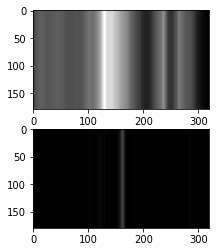

Iteration 191: error=1.125e-02, rank=19, nnz=749520, time=7.630e-02
Iteration 192: error=1.126e-02, rank=19, nnz=749160, time=7.189e-02
Iteration 193: error=1.125e-02, rank=19, nnz=748800, time=9.163e-02
Iteration 194: error=1.127e-02, rank=18, nnz=751320, time=7.574e-02
Iteration 195: error=1.126e-02, rank=19, nnz=750240, time=6.507e-02
Iteration 196: error=1.126e-02, rank=19, nnz=750060, time=8.403e-02
Iteration 197: error=1.126e-02, rank=19, nnz=750240, time=7.719e-02
Iteration 198: error=1.127e-02, rank=18, nnz=750960, time=7.198e-02
Iteration 199: error=1.126e-02, rank=18, nnz=751680, time=6.276e-02
Iteration 200: error=1.127e-02, rank=18, nnz=752040, time=6.392e-02


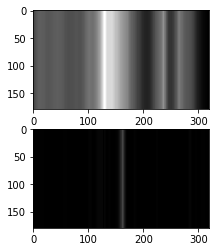

Iteration 201: error=1.128e-02, rank=18, nnz=752220, time=6.598e-02
Iteration 202: error=1.129e-02, rank=18, nnz=754380, time=7.238e-02
Iteration 203: error=1.127e-02, rank=18, nnz=752580, time=8.833e-02
Iteration 204: error=1.127e-02, rank=18, nnz=751860, time=7.762e-02
Iteration 205: error=1.126e-02, rank=19, nnz=750240, time=6.400e-02
Iteration 206: error=1.126e-02, rank=19, nnz=748440, time=7.397e-02
Iteration 207: error=1.126e-02, rank=19, nnz=748440, time=7.261e-02
Iteration 208: error=1.126e-02, rank=19, nnz=749160, time=6.876e-02
Iteration 209: error=1.126e-02, rank=18, nnz=749700, time=7.271e-02
Iteration 210: error=1.126e-02, rank=19, nnz=749700, time=6.216e-02


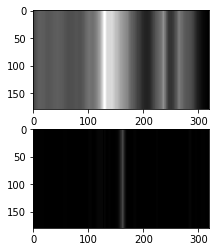

Iteration 211: error=1.126e-02, rank=19, nnz=749880, time=7.065e-02
Iteration 212: error=1.126e-02, rank=19, nnz=749700, time=6.856e-02
Iteration 213: error=1.126e-02, rank=18, nnz=750060, time=6.819e-02
Iteration 214: error=1.126e-02, rank=19, nnz=749160, time=6.299e-02
Iteration 215: error=1.126e-02, rank=19, nnz=748800, time=6.817e-02
Iteration 216: error=1.126e-02, rank=19, nnz=749700, time=6.830e-02
Iteration 217: error=1.126e-02, rank=19, nnz=751680, time=6.747e-02
Iteration 218: error=1.126e-02, rank=19, nnz=750420, time=7.043e-02
Iteration 219: error=1.126e-02, rank=19, nnz=750420, time=7.035e-02
Iteration 220: error=1.127e-02, rank=18, nnz=750780, time=6.849e-02


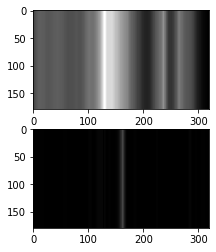

Iteration 221: error=1.126e-02, rank=18, nnz=750240, time=6.917e-02
Iteration 222: error=1.126e-02, rank=18, nnz=750960, time=6.488e-02
Iteration 223: error=1.126e-02, rank=18, nnz=750240, time=6.531e-02
Iteration 224: error=1.126e-02, rank=19, nnz=751860, time=6.721e-02
Iteration 225: error=1.126e-02, rank=19, nnz=749880, time=7.216e-02
Iteration 226: error=1.126e-02, rank=18, nnz=749880, time=7.040e-02
Iteration 227: error=1.126e-02, rank=18, nnz=751140, time=6.377e-02
Iteration 228: error=1.128e-02, rank=18, nnz=753480, time=6.311e-02
Iteration 229: error=1.127e-02, rank=19, nnz=751680, time=6.280e-02
Iteration 230: error=1.127e-02, rank=18, nnz=752220, time=6.689e-02


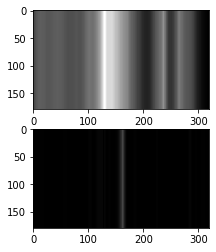

Iteration 231: error=1.127e-02, rank=18, nnz=752040, time=6.693e-02
Iteration 232: error=1.128e-02, rank=19, nnz=750600, time=6.219e-02
Iteration 233: error=1.128e-02, rank=18, nnz=751680, time=6.763e-02
Iteration 234: error=1.127e-02, rank=18, nnz=750240, time=6.290e-02
Iteration 235: error=1.127e-02, rank=18, nnz=751140, time=6.282e-02
Iteration 236: error=1.127e-02, rank=18, nnz=750960, time=6.614e-02
Iteration 237: error=1.127e-02, rank=18, nnz=750240, time=6.358e-02
Iteration 238: error=1.128e-02, rank=18, nnz=750960, time=6.298e-02
Iteration 239: error=1.127e-02, rank=19, nnz=750600, time=6.387e-02
Iteration 240: error=1.126e-02, rank=19, nnz=749520, time=6.622e-02


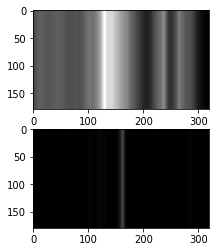

Iteration 241: error=1.127e-02, rank=19, nnz=751140, time=7.042e-02
Iteration 242: error=1.127e-02, rank=18, nnz=749520, time=6.758e-02
Iteration 243: error=1.127e-02, rank=18, nnz=750240, time=6.304e-02
Iteration 244: error=1.127e-02, rank=18, nnz=749160, time=6.457e-02
Iteration 245: error=1.127e-02, rank=19, nnz=750240, time=6.322e-02
Iteration 246: error=1.126e-02, rank=19, nnz=750960, time=6.828e-02
Iteration 247: error=1.127e-02, rank=19, nnz=750060, time=6.778e-02
Iteration 248: error=1.126e-02, rank=19, nnz=749160, time=6.719e-02
Iteration 249: error=1.127e-02, rank=19, nnz=750240, time=6.865e-02
Iteration 250: error=1.126e-02, rank=19, nnz=750420, time=7.086e-02


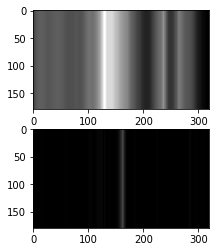

Iteration 251: error=1.127e-02, rank=18, nnz=752040, time=8.102e-02
Iteration 252: error=1.128e-02, rank=19, nnz=752940, time=8.496e-02
Iteration 253: error=1.126e-02, rank=19, nnz=750780, time=7.213e-02
Iteration 254: error=1.127e-02, rank=18, nnz=750780, time=6.750e-02
Iteration 255: error=1.127e-02, rank=19, nnz=750780, time=6.374e-02
Iteration 256: error=1.127e-02, rank=19, nnz=750240, time=6.635e-02
Iteration 257: error=1.127e-02, rank=19, nnz=748980, time=6.764e-02
Iteration 258: error=1.127e-02, rank=19, nnz=750240, time=6.776e-02
Iteration 259: error=1.127e-02, rank=19, nnz=750240, time=9.392e-02
Iteration 260: error=1.127e-02, rank=19, nnz=750240, time=8.917e-02


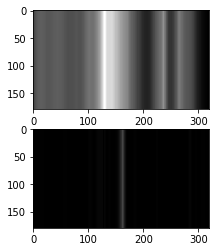

Iteration 261: error=1.127e-02, rank=19, nnz=752400, time=7.014e-02
Iteration 262: error=1.126e-02, rank=19, nnz=750780, time=6.700e-02
Iteration 263: error=1.127e-02, rank=19, nnz=750780, time=6.772e-02
Iteration 264: error=1.128e-02, rank=18, nnz=753480, time=6.940e-02
Iteration 265: error=1.128e-02, rank=19, nnz=752220, time=6.328e-02
Iteration 266: error=1.128e-02, rank=19, nnz=751140, time=9.589e-02
Iteration 267: error=1.127e-02, rank=19, nnz=751140, time=9.296e-02
Iteration 268: error=1.127e-02, rank=19, nnz=752040, time=6.811e-02
Iteration 269: error=1.127e-02, rank=19, nnz=751320, time=6.767e-02
Iteration 270: error=1.127e-02, rank=18, nnz=751680, time=9.087e-02


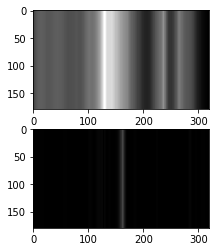

Iteration 271: error=1.129e-02, rank=18, nnz=753660, time=8.957e-02
Iteration 272: error=1.128e-02, rank=18, nnz=753660, time=8.514e-02
Iteration 273: error=1.127e-02, rank=19, nnz=752580, time=7.859e-02
Iteration 274: error=1.128e-02, rank=19, nnz=752040, time=8.862e-02
Iteration 275: error=1.127e-02, rank=19, nnz=751500, time=8.848e-02
Iteration 276: error=1.127e-02, rank=19, nnz=751500, time=8.880e-02
Iteration 277: error=1.127e-02, rank=19, nnz=750960, time=9.805e-02
Iteration 278: error=1.127e-02, rank=19, nnz=751680, time=9.663e-02
Iteration 279: error=1.127e-02, rank=19, nnz=750960, time=9.951e-02
Iteration 280: error=1.127e-02, rank=19, nnz=751500, time=8.661e-02


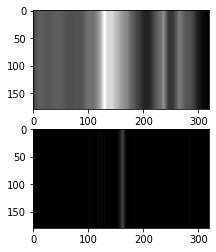

Iteration 281: error=1.127e-02, rank=18, nnz=752400, time=8.625e-02
Iteration 282: error=1.127e-02, rank=18, nnz=751680, time=6.718e-02
Iteration 283: error=1.128e-02, rank=18, nnz=753120, time=6.845e-02
Iteration 284: error=1.127e-02, rank=19, nnz=752040, time=6.955e-02
Iteration 285: error=1.127e-02, rank=19, nnz=752040, time=6.763e-02
Iteration 286: error=1.127e-02, rank=18, nnz=751860, time=6.710e-02
Iteration 287: error=1.127e-02, rank=18, nnz=752220, time=6.244e-02
Iteration 288: error=1.127e-02, rank=18, nnz=752760, time=6.325e-02
Iteration 289: error=1.128e-02, rank=18, nnz=753480, time=6.339e-02
Iteration 290: error=1.130e-02, rank=18, nnz=755100, time=6.167e-02


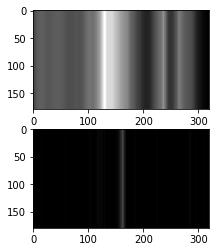

Iteration 291: error=1.129e-02, rank=19, nnz=756180, time=6.527e-02
Iteration 292: error=1.128e-02, rank=18, nnz=753300, time=6.760e-02
Iteration 293: error=1.128e-02, rank=18, nnz=752580, time=6.290e-02
Iteration 294: error=1.129e-02, rank=18, nnz=754920, time=6.296e-02
Iteration 295: error=1.129e-02, rank=18, nnz=755460, time=6.320e-02
Iteration 296: error=1.128e-02, rank=18, nnz=753300, time=6.307e-02
Iteration 297: error=1.128e-02, rank=18, nnz=752220, time=6.145e-02
Iteration 298: error=1.128e-02, rank=18, nnz=752580, time=6.316e-02
Iteration 299: error=1.131e-02, rank=18, nnz=757080, time=6.244e-02
Iteration 300: error=1.128e-02, rank=19, nnz=753840, time=6.302e-02


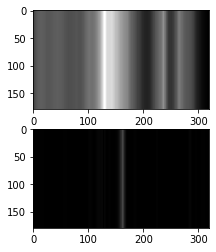

Iteration 301: error=1.128e-02, rank=19, nnz=754020, time=7.048e-02
Iteration 302: error=1.128e-02, rank=19, nnz=753480, time=6.756e-02
Iteration 303: error=1.127e-02, rank=19, nnz=752400, time=6.753e-02
Iteration 304: error=1.128e-02, rank=19, nnz=752580, time=6.788e-02
Iteration 305: error=1.127e-02, rank=19, nnz=751860, time=6.794e-02
Iteration 306: error=1.127e-02, rank=19, nnz=751500, time=6.612e-02
Iteration 307: error=1.127e-02, rank=18, nnz=752400, time=6.766e-02
Iteration 308: error=1.128e-02, rank=18, nnz=753120, time=6.284e-02
Iteration 309: error=1.128e-02, rank=18, nnz=753120, time=6.278e-02
Iteration 310: error=1.128e-02, rank=18, nnz=753840, time=6.276e-02


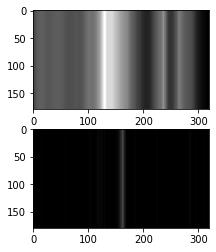

Iteration 311: error=1.127e-02, rank=19, nnz=752400, time=9.785e-02
Iteration 312: error=1.127e-02, rank=19, nnz=752040, time=9.611e-02
Iteration 313: error=1.127e-02, rank=19, nnz=752760, time=9.520e-02
Iteration 314: error=1.128e-02, rank=18, nnz=754020, time=7.537e-02
Iteration 315: error=1.131e-02, rank=18, nnz=755820, time=6.788e-02
Iteration 316: error=1.129e-02, rank=18, nnz=755100, time=6.393e-02
Iteration 317: error=1.129e-02, rank=18, nnz=755640, time=6.605e-02
Iteration 318: error=1.129e-02, rank=19, nnz=754920, time=6.750e-02
Iteration 319: error=1.128e-02, rank=19, nnz=752940, time=7.338e-02
Iteration 320: error=1.128e-02, rank=19, nnz=754560, time=7.258e-02


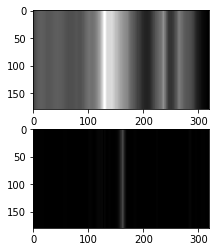

Iteration 321: error=1.128e-02, rank=19, nnz=753840, time=8.259e-02
Iteration 322: error=1.127e-02, rank=19, nnz=751860, time=7.864e-02
Iteration 323: error=1.128e-02, rank=18, nnz=752760, time=7.681e-02
Iteration 324: error=1.130e-02, rank=18, nnz=756000, time=6.353e-02
Iteration 325: error=1.129e-02, rank=18, nnz=755100, time=6.479e-02
Iteration 326: error=1.128e-02, rank=19, nnz=753840, time=6.387e-02
Iteration 327: error=1.128e-02, rank=18, nnz=752400, time=6.954e-02
Iteration 328: error=1.128e-02, rank=18, nnz=754380, time=6.393e-02
Iteration 329: error=1.130e-02, rank=18, nnz=756000, time=8.308e-02
Iteration 330: error=1.130e-02, rank=18, nnz=757980, time=6.743e-02


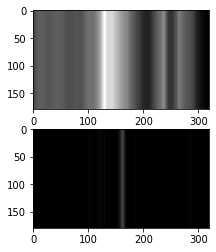

Iteration 331: error=1.129e-02, rank=18, nnz=755460, time=6.839e-02
Iteration 332: error=1.128e-02, rank=19, nnz=753480, time=6.487e-02
Iteration 333: error=1.128e-02, rank=19, nnz=753300, time=8.784e-02
Iteration 334: error=1.127e-02, rank=19, nnz=751680, time=7.007e-02
Iteration 335: error=1.128e-02, rank=19, nnz=751680, time=7.125e-02
Iteration 336: error=1.128e-02, rank=19, nnz=751860, time=8.247e-02
Iteration 337: error=1.127e-02, rank=19, nnz=752940, time=8.225e-02
Iteration 338: error=1.127e-02, rank=19, nnz=752580, time=6.744e-02
Iteration 339: error=1.128e-02, rank=19, nnz=751680, time=6.971e-02
Iteration 340: error=1.127e-02, rank=19, nnz=751500, time=8.061e-02


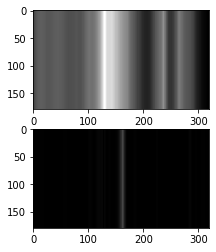

Iteration 341: error=1.129e-02, rank=19, nnz=753840, time=8.950e-02
Iteration 342: error=1.128e-02, rank=19, nnz=752940, time=7.321e-02
Iteration 343: error=1.129e-02, rank=19, nnz=752940, time=7.166e-02
Iteration 344: error=1.128e-02, rank=19, nnz=753480, time=6.975e-02
Iteration 345: error=1.128e-02, rank=18, nnz=751860, time=7.964e-02
Iteration 346: error=1.128e-02, rank=19, nnz=752940, time=6.678e-02
Iteration 347: error=1.128e-02, rank=19, nnz=752760, time=7.365e-02
Iteration 348: error=1.128e-02, rank=19, nnz=752400, time=6.874e-02
Iteration 349: error=1.128e-02, rank=18, nnz=753480, time=7.082e-02
Iteration 350: error=1.129e-02, rank=19, nnz=753120, time=6.488e-02


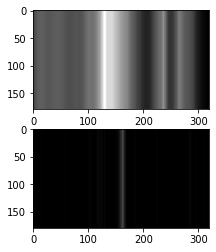

Iteration 351: error=1.128e-02, rank=18, nnz=752580, time=6.869e-02
Iteration 352: error=1.127e-02, rank=19, nnz=752400, time=6.258e-02
Iteration 353: error=1.128e-02, rank=19, nnz=752760, time=7.065e-02
Iteration 354: error=1.128e-02, rank=19, nnz=753660, time=6.832e-02
Iteration 355: error=1.128e-02, rank=19, nnz=753480, time=8.265e-02
Iteration 356: error=1.128e-02, rank=19, nnz=753120, time=7.294e-02
Iteration 357: error=1.128e-02, rank=18, nnz=752940, time=7.247e-02
Iteration 358: error=1.128e-02, rank=18, nnz=752940, time=7.776e-02
Iteration 359: error=1.128e-02, rank=19, nnz=753300, time=7.074e-02
Iteration 360: error=1.128e-02, rank=19, nnz=752940, time=8.007e-02


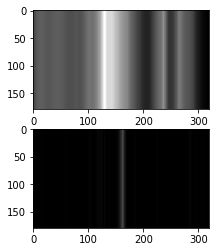

Iteration 361: error=1.127e-02, rank=19, nnz=752760, time=9.749e-02
Iteration 362: error=1.129e-02, rank=19, nnz=754380, time=9.015e-02
Iteration 363: error=1.127e-02, rank=19, nnz=752040, time=8.177e-02
Iteration 364: error=1.128e-02, rank=19, nnz=752760, time=7.796e-02
Iteration 365: error=1.128e-02, rank=18, nnz=752760, time=8.814e-02
Iteration 366: error=1.129e-02, rank=19, nnz=755100, time=7.455e-02
Iteration 367: error=1.128e-02, rank=19, nnz=755100, time=8.394e-02
Iteration 368: error=1.128e-02, rank=19, nnz=752940, time=8.104e-02
Iteration 369: error=1.128e-02, rank=19, nnz=752400, time=8.617e-02
Iteration 370: error=1.128e-02, rank=18, nnz=753120, time=8.014e-02


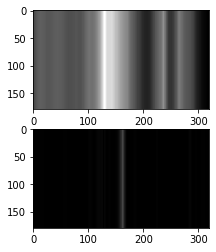

Iteration 371: error=1.128e-02, rank=18, nnz=753300, time=9.278e-02
Iteration 372: error=1.128e-02, rank=18, nnz=752760, time=9.065e-02
Iteration 373: error=1.129e-02, rank=19, nnz=754380, time=8.649e-02
Iteration 374: error=1.128e-02, rank=19, nnz=752940, time=8.023e-02
Iteration 375: error=1.128e-02, rank=19, nnz=754740, time=8.738e-02
Iteration 376: error=1.128e-02, rank=18, nnz=755460, time=8.340e-02
Iteration 377: error=1.128e-02, rank=18, nnz=754200, time=7.787e-02
Iteration 378: error=1.128e-02, rank=18, nnz=754020, time=7.165e-02
Iteration 379: error=1.128e-02, rank=18, nnz=754200, time=7.715e-02
Iteration 380: error=1.128e-02, rank=18, nnz=754380, time=7.077e-02


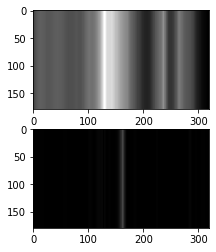

Iteration 381: error=1.129e-02, rank=18, nnz=754200, time=7.482e-02
Iteration 382: error=1.129e-02, rank=19, nnz=754740, time=7.179e-02
Iteration 383: error=1.128e-02, rank=19, nnz=753480, time=1.051e-01
Iteration 384: error=1.128e-02, rank=19, nnz=752220, time=8.532e-02
Iteration 385: error=1.128e-02, rank=18, nnz=752580, time=8.243e-02
Iteration 386: error=1.128e-02, rank=18, nnz=752040, time=7.385e-02
Iteration 387: error=1.128e-02, rank=18, nnz=753660, time=7.844e-02
Iteration 388: error=1.128e-02, rank=18, nnz=752760, time=1.018e-01
Iteration 389: error=1.129e-02, rank=19, nnz=754020, time=8.588e-02
Iteration 390: error=1.129e-02, rank=18, nnz=754020, time=7.561e-02


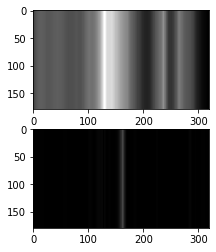

Iteration 391: error=1.128e-02, rank=19, nnz=753840, time=9.901e-02
Iteration 392: error=1.128e-02, rank=19, nnz=753480, time=8.893e-02
Iteration 393: error=1.128e-02, rank=18, nnz=752580, time=8.836e-02
Iteration 394: error=1.128e-02, rank=18, nnz=754740, time=8.568e-02
Iteration 395: error=1.128e-02, rank=18, nnz=752940, time=8.329e-02
Iteration 396: error=1.128e-02, rank=19, nnz=753480, time=8.755e-02
Iteration 397: error=1.128e-02, rank=19, nnz=753120, time=9.112e-02
Iteration 398: error=1.128e-02, rank=19, nnz=752400, time=9.411e-02
Iteration 399: error=1.128e-02, rank=19, nnz=752400, time=1.015e-01
Iteration 400: error=1.128e-02, rank=19, nnz=751680, time=9.260e-02


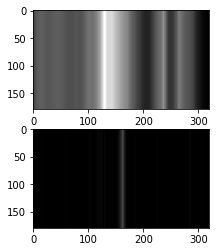

Iteration 401: error=1.128e-02, rank=19, nnz=752580, time=1.126e-01
Iteration 402: error=1.128e-02, rank=19, nnz=753480, time=7.858e-02
Iteration 403: error=1.128e-02, rank=19, nnz=752580, time=9.803e-02
Iteration 404: error=1.128e-02, rank=19, nnz=752940, time=7.970e-02
Iteration 405: error=1.129e-02, rank=19, nnz=752580, time=9.457e-02
Iteration 406: error=1.128e-02, rank=18, nnz=752940, time=7.908e-02
Iteration 407: error=1.129e-02, rank=19, nnz=752940, time=8.834e-02
Iteration 408: error=1.128e-02, rank=18, nnz=752940, time=7.985e-02
Iteration 409: error=1.129e-02, rank=18, nnz=754200, time=8.176e-02
Iteration 410: error=1.130e-02, rank=18, nnz=757440, time=7.796e-02


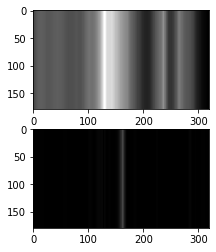

Iteration 411: error=1.129e-02, rank=18, nnz=754920, time=8.016e-02
Iteration 412: error=1.129e-02, rank=18, nnz=754380, time=7.974e-02
Iteration 413: error=1.129e-02, rank=18, nnz=754560, time=8.142e-02
Iteration 414: error=1.129e-02, rank=18, nnz=754560, time=8.306e-02
Iteration 415: error=1.128e-02, rank=18, nnz=753660, time=7.943e-02
Iteration 416: error=1.129e-02, rank=18, nnz=753660, time=7.779e-02
Iteration 417: error=1.129e-02, rank=18, nnz=753840, time=7.888e-02
Iteration 418: error=1.128e-02, rank=19, nnz=753480, time=7.592e-02
Iteration 419: error=1.128e-02, rank=19, nnz=752580, time=8.267e-02
Iteration 420: error=1.128e-02, rank=19, nnz=752580, time=7.816e-02


KeyboardInterrupt: 

In [7]:
image_L, image_S, radar_L, radar_S, (u, s, v), errors, ranks, nnzs = ista(M_F, verbose=True, maxiter=500,
                                          plot_num=10,im_shape=[720//4,1280//4]) ##############